In [1]:
import sys
sys.path.append('/home/painchess/projects_clean/Simulations')
sys.path.append('/home/painchess/projects_clean/Halo_Analytical_Calculations')
import cosmo_parameters as cp
import simulation as sm
import numpy as np
import matplotlib.pyplot as plt
from astropy.cosmology import LambdaCDM
from astropy.io import ascii
from astropy.table import Table
from scipy.stats import gaussian_kde


In [2]:
def kde_hist2d(x,y, nbins=100):
    k = gaussian_kde([x,y])
    xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
    return xi, yi, k(np.vstack([xi.flatten(), yi.flatten()]))

## Defining the simulation paths, names and cosmology

In [3]:
old_path = '/home/painchess/disq2/ahf-v1.0-101/'
path = '/home/painchess/sims/'

sim_names = ['M25S07', 'M25S08', 'M25S09', 'M03S07','M03S08', 'M03S09', 'M35S07', 'M35S08', 'M35S09',
             'Illustris', 'bolshoiP', 'bolshoiW', 'M03S08b', 'm25s85', 'm2s8', 'm4s7', 'm4s8', 'm2s9',
             'm3s8_50', 'm3s8', 'm35s75', 'm4s9', 'm3s9', 'm25s75', 'm2s1', 'm3s7', 'm3s85', 'm2s7', 'm25s8', 'm35s8', 'm25s9', 'm35s85', 'm3s75']
omegas = [0.25, 0.25, 0.25, 0.3, 0.3, 0.3, 0.35, 0.35, 0.35, 0.309, 0.307, 0.27, 0.3, 0.25, 0.2, 0.4, 0.4, 0.2,  0.3
          ,0.3, 0.35, 0.4, 0.3, 0.25, 0.2, 0.3, 0.3, 0.2, 0.25, 0.35, 0.25, 0.35, 0.3]
sigmas = [0.7, 0.8, 0.9, 0.7, 0.8, 0.9, 0.7, 0.8, 0.9, 0.816, 0.82, 0.82, 0.8, 0.85, 0.8, 0.7, 0.8, 0.9, 0.8
          ,0.8, 0.75, 0.9, 0.9, 0.75, 1.0, 0.7, 0.85, 0.7, 0.8, 0.8, 0.9, 0.85, 0.75]
sims = dict(zip(sim_names, list(zip(omegas, sigmas))))

## Loading a simulation

In [4]:
sim = 'm4s9'
snap = 0
sim1 = sm.Simulation(sim, sims[sim][0], sims[sim][1], path)
reds = sim1.get_redshifts()

In [5]:
halos = sim1.read_halos(snapshot=snap)
halos

,#ID(1),hostHalo(2),numSubStruct(3),Mhalo(4),npart(5),Xc(6),Yc(7),Zc(8),VXc(9),VYc(10),...,Ecy(34),Ecz(35),ovdens(36),nbins(37),fMhires(38),Ekin(39),Epot(40),SurfP(41),Phi0(42),cNFW(43)
0,5767934694459379515,0,31,2.366920e+15,183185,1443.086675,22391.679463,220609.245972,157.74,120.74,...,-0.062180,0.955183,199.99,29,1.0,7.409120e+21,-1.059610e+22,-2.616080e+21,18844500.0,3.57330
1,5855647405310148961,0,25,1.563650e+15,121017,39482.330844,145290.244134,93918.763308,-303.86,303.52,...,0.903458,-0.375422,199.99,28,1.0,3.876710e+21,-5.329680e+21,-8.281810e+20,13288300.0,4.96637
2,4847721704572706253,0,18,9.978070e+14,77224,102364.363470,102989.276036,58325.720116,8.96,-30.43,...,-0.042459,0.806496,199.99,26,1.0,1.592250e+21,-2.375130e+21,-6.403700e+20,9181300.0,3.78894
3,4649456738801694882,0,8,9.721460e+14,75238,16380.379159,135031.465961,69413.458868,-260.13,-156.39,...,-0.409110,0.784201,200.00,26,1.0,1.626190e+21,-2.299530e+21,-6.670370e+20,9695130.0,3.80684
4,4677439040520594520,0,6,7.658890e+14,59275,28516.242653,12609.527408,191936.605135,-531.13,-56.58,...,0.862973,-0.223165,199.98,26,1.0,1.082710e+21,-1.600600e+21,-4.362830e+20,8020010.0,3.60240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
537060,2548341834737454884,0,0,1.292090e+12,100,105167.051668,198499.719448,345598.257055,331.09,328.28,...,0.105190,-0.341464,188.85,8,1.0,2.516810e+16,-4.504180e+16,-2.824860e+15,104457.0,11.17810
537061,2421626504283635515,0,0,1.292090e+12,100,50212.950415,237659.293380,476469.007822,-317.03,-162.72,...,0.135340,0.820914,187.98,8,1.0,1.861020e+16,-3.698520e+16,-8.880050e+15,90305.5,5.80430
537062,2551809561569727707,0,0,1.292090e+12,100,106671.196135,138090.369456,471296.235042,736.32,159.79,...,-0.212604,0.951733,191.15,8,1.0,2.898980e+16,-4.779420e+16,-4.746270e+15,129914.0,12.20110
537063,2311595812330508247,0,0,1.292090e+12,100,2494.970970,71977.399122,423809.037785,234.34,-234.45,...,-0.473881,0.844896,192.82,8,1.0,2.172390e+16,-4.040440e+16,-4.706740e+15,100405.0,6.93920


In [ ]:
# This makes age and formation history quantities. Option to save
zxs, zmms, mofzs, m_indx = sim1.make_zxs(z=0, save=True)

In [6]:
# If age quantities are already saved in the proper folder, they can be immediately loaded
zxs = sim1.get_agedata(0, 'zx')
zmms = sim1.get_agedata(0, 'zmm')
mofzs = sim1.get_agedata(0, 'mofz')
m_indx = sim1.get_agedata(0, 'oth')

## Loading 2D and 3D structural properties

In [8]:
props2d = np.load(path+sim+'/data/nprops2D_{}_snap{}.npy'.format(sim, 118-snap), allow_pickle=True)
props3d = np.load(path+sim+'/data/nprops3D_{}_snap{}.npy'.format(sim, 118-snap), allow_pickle=True)

# Making a dictionnary linking halo ID from AHF to an index from 0 to Nhalos
halids = np.array(halos['#ID(1)'], dtype=int)
idkeys = dict(zip(halids, np.arange(len(halids))))

mb_min = [7e12, 3e13, 1e14, 1e13]
mb_max = [8e12, 5e13, 1e15, 1e16]

# Combining age and structure data in two Tables, one with 2D and one with 3D structure.

In [9]:
# Choose a type of age property. zmm z at last major merger. zx is z at mass fraction x/100
data = zmms
#props = ['z90', 'z75', 'z50', 'z10', 'z1']
props = ['zmm30', 'zmm25', 'zmm20', 'zmm10']
#props = ['z50']
maxval=50 #Value to avoid infinite zxs for those who have issues
for prop in props:
    #cl_data = data[data[prop]>0].reset_index()
    #clm_indx = m_indx[data[prop]>0].reset_index()
    
    cl_data = data[data[prop]<maxval].reset_index()
    clm_indx = m_indx[data[prop]<maxval].reset_index()
    
    for j in range(len(mb_min)):
        ult_data2d = []
        ult_data3d = []
        for i in range(len(cl_data)):
            if mb_min[j]<clm_indx.loc[i]['Mass']<mb_max[j]:
                hid = clm_indx['Halo_index'].loc[i]
                halidx = idkeys[hid]
                ult_data3d.append([halidx, cl_data.loc[i][prop], props3d[halidx][0], 
                                  props3d[halidx][1][0], props3d[halidx][1][1], props3d[halidx][2][0], props3d[halidx][2][1]])
                ult_data2d.append([halidx, cl_data.loc[i][prop], props2d[halidx][0], 
                                  props2d[halidx][1][0], props2d[halidx][1][1], props2d[halidx][2][0], props2d[halidx][2][1], props2d[halidx][3], props2d[halidx][5], props2d[halidx][6]])
        data3d = Table(np.array(ult_data3d), names=['Halo_index', prop, 'Conc', r'$\chi^2_\rho$', 'log_Chi_rho', r'$\chi^2_M$', 'log_Chi_M'])
        data2d = Table(np.array(ult_data2d), names=['Halo_index', prop, 'Conc', r'$\chi^2_\rho$', 'log_Chi_rho', r'$\chi^2_M$', 'log_Chi_M', 'axis_ratio', 'mbp_off', 'com_off'])
        ascii.write(data3d, path+sim+'/data/{}_{}_dat3d_{:1.2e}.dat'.format(prop, sim, mb_min[j]), overwrite=True)
        ascii.write(data2d, path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(prop, sim, mb_min[j]), overwrite=True)


In [11]:
# Addition of the McBride fit parameters to the age parameters
data = m_indx
prop = r'$\gamma-\beta$'
#props = ['zmm30']
maxval=5

ndat = data['McBride_gamma']-data['McBride_beta']
    
cl_data = ndat[abs(ndat)<maxval].reset_index(drop=True)
clm_indx = m_indx[abs(ndat)<maxval].reset_index(drop=True)

for j in range(len(mb_min)):
    ult_data2d = []
    ult_data3d = []
    for i in range(len(cl_data)):
        if mb_min[j]<clm_indx.loc[i]['Mass']<mb_max[j]:
            hid = clm_indx['Halo_index'].loc[i]
            halidx = idkeys[hid]
            ult_data3d.append([halidx, cl_data.loc[i], props3d[halidx][0], 
                              props3d[halidx][1][0], props3d[halidx][1][1], props3d[halidx][2][0], props3d[halidx][2][1]])
            ult_data2d.append([halidx, cl_data.loc[i], props2d[halidx][0], 
                              props2d[halidx][1][0], props2d[halidx][1][1], props2d[halidx][2][0], props2d[halidx][2][1],props2d[halidx][3], props2d[halidx][5], props2d[halidx][6]])
    data3d = Table(np.array(ult_data3d), names=['Halo_index', prop, 'Conc', r'$\chi^2_\rho$', 'log_Chi_rho', r'$\chi^2_M$', 'log_Chi_M'])
    data2d = Table(np.array(ult_data2d), names=['Halo_index', prop, 'Conc', r'$\chi^2_\rho$', 'log_Chi_rho', r'$\chi^2_M$', 'log_Chi_M', 'axis_ratio', 'mbp_off', 'com_off'])
    ascii.write(data3d, path+sim+'/data/{}_{}_dat3d_{:1.2e}.dat'.format(prop, sim, mb_min[j]), overwrite=True)
    ascii.write(data2d, path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(prop, sim, mb_min[j]), overwrite=True)


# 3D PROPERTIES vs z50

## USING AHF HALOS FILES 

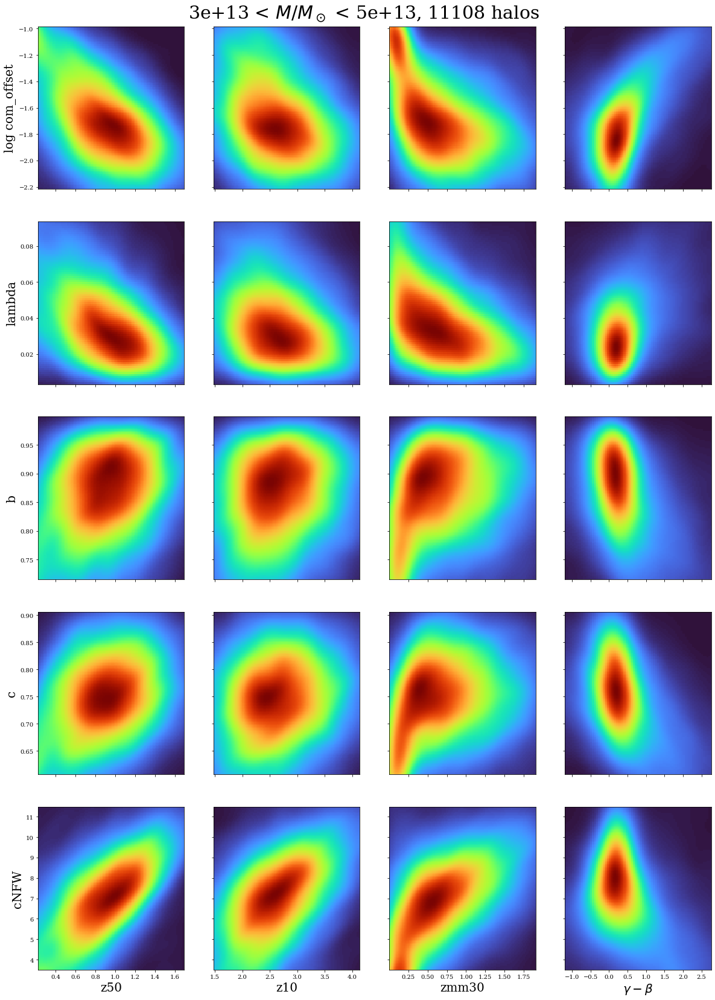

In [14]:
propages = ['z50', 'z10', 'zmm30', r'$\gamma-\beta$']
ahfprops = ['com_offset(16)', 'lambda(20)', 'b(25)', 'c(26)', 'cNFW(43)']
#for k in range(1,3):
k = 1
fig, axs = plt.subplots(5,4, figsize=[20,26], sharex='col', sharey='row')

for i in range(4):
    propage = propages[i]
    dat = ascii.read(path+sim+'/data/{}_{}_dat3d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) 
    idx = np.array(dat['Halo_index'])
    axs[-1,i].set_xlabel(propage, size=20)
    for j in range(5):
        prop = ahfprops[j]
        if j == 0:
            y = np.log10(halos[prop][idx][halos[prop][idx]>0])-3
        else:   
            y = halos[prop][idx][halos[prop][idx]>0]
        x = dat[propage][halos[prop][idx]>0]
        xmin, xmax = max(np.min(x), np.mean(x)-1.5*np.std(x)),  min(np.max(x), np.mean(x)+2*np.std(x))
        ymin, ymax = max(np.min(y),np.mean(y)-1.5*np.std(y)), min(np.max(y), np.mean(y)+2*np.std(y))
        xi, yi, zi= kde_hist2d(x, y, nbins=200)
        #print(i, j, np.max(zi))
        axs[j,i].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap='turbo')
        axs[j,i].set_xlim(xmin, xmax)
        axs[j,i].set_ylim(ymin, ymax)
        # if j<2:
        #     axs[j,i].set_yscale('log')
        if i == 0:
            if j==0:
                axs[j,i].set_ylabel('log '+prop[:-4], size=20)
            else:
                axs[j,i].set_ylabel(prop[:-4], size=20)
#plt.tight_layout()
fig.subplots_adjust(top=0.96)
fig.suptitle(r'{:2.1} < $M/M_\odot$ < {:2.1}, {:d} halos'.format(mb_min[k], mb_max[k], len(x)), size=30)
#plt.tight_layout()
fig.savefig('./figs/ahfprop_corr_{:1.2e}n_{}.png'.format(mb_min[k], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
fig.savefig('./figs/ahfprop_corr_{:1.2e}n_{}.pdf'.format(mb_min[k], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)


In [ ]:
zmaxs = [1.26]

# WITHOUT z10 to go to lower mass

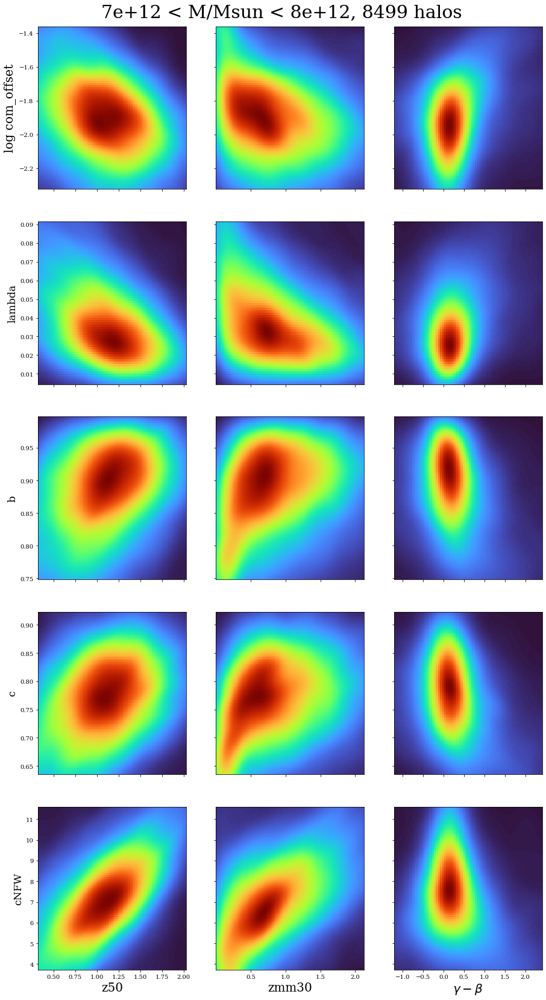

In [34]:
propages = ['z50', 'zmm30', r'$\gamma-\beta$']
ahfprops = ['com_offset(16)', 'lambda(20)', 'b(25)', 'c(26)', 'cNFW(43)']
#for k in range(1,3):
k = 0
fig, axs = plt.subplots(5,3, figsize=[15,26], sharex='col', sharey='row')

for i in range(3):
    propage = propages[i]
    dat = ascii.read(path+sim+'/data/{}_{}_dat3d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) 
    idx = np.array(dat['Halo_index'])
    axs[-1,i].set_xlabel(propage, size=20)
    for j in range(5):
        prop = ahfprops[j]
        if j == 0:
            y = np.log10(halos[prop][idx][halos[prop][idx]>0])-3
        else:   
            y = halos[prop][idx][halos[prop][idx]>0]
        x = dat[propage][halos[prop][idx]>0]
        xmin, xmax = max(np.min(x), np.mean(x)-1.5*np.std(x)),  min(np.max(x), np.mean(x)+2*np.std(x))
        ymin, ymax = max(np.min(y),np.mean(y)-1.5*np.std(y)),  min(np.max(y), np.mean(y)+2*np.std(y))
        xi, yi, zi= kde_hist2d(x, y, nbins=200)
        axs[j,i].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
        axs[j,i].set_xlim(xmin, xmax)
        axs[j,i].set_ylim(ymin, ymax)
        # if j<2:
        #     axs[j,i].set_yscale('log')
        if i == 0:
            if j==0:
                axs[j,i].set_ylabel('log '+prop[:-4], size=20)
            else:
                axs[j,i].set_ylabel(prop[:-4], size=17)
#plt.tight_layout()
fig.subplots_adjust(top=0.96)
fig.suptitle('{:2.1} < M/Msun < {:2.1}, {:d} halos'.format(mb_min[k], mb_max[k], len(x)), size=30)
#plt.tight_layout()
fig.savefig('./figs/ahfprop_corr_{:1.2e}n.png'.format(mb_min[k]), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
fig.savefig('./figs/ahfprop_corr_{:1.2e}n.pdf'.format(mb_min[k]), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)


# COMBINED AHF PROPERTIES

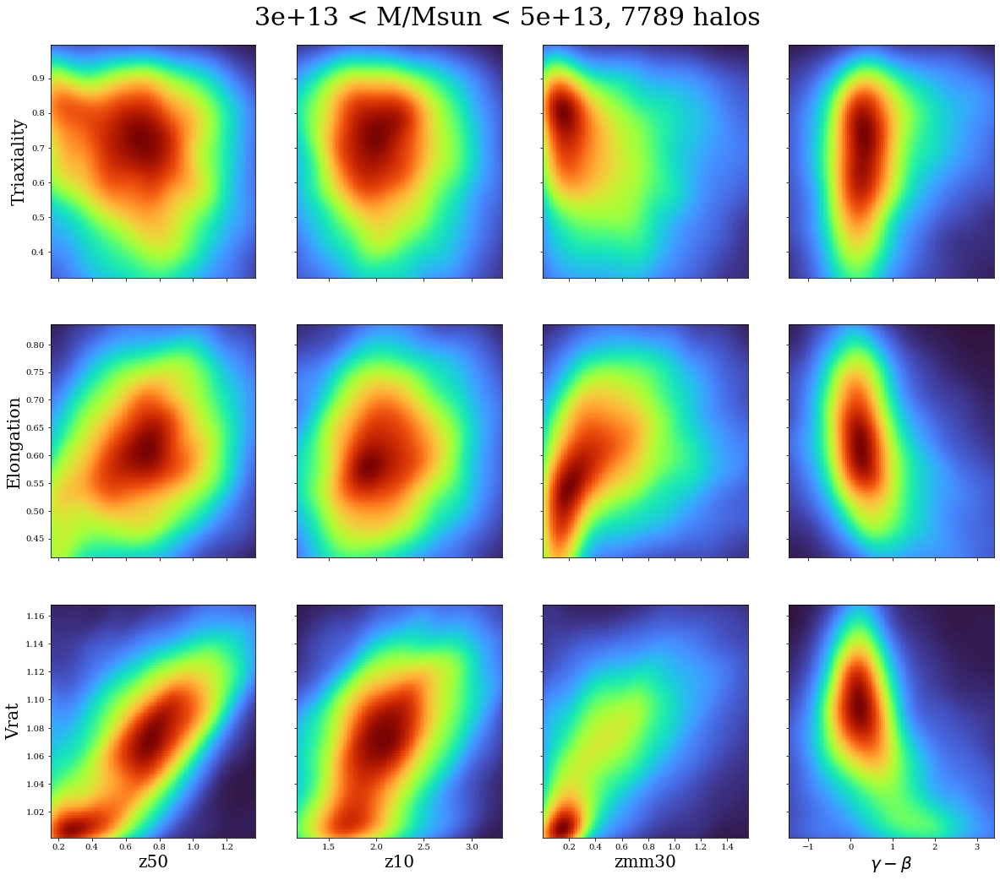

In [39]:
cprops = ['Triaxiality', 'Elongation', 'Vrat']
propages = ['z50', 'z10', 'zmm30', r'$\gamma-\beta$']
#for k in range(1,3):
k = 1
fig, axs = plt.subplots(3,4, figsize=[20,16], sharex='col', sharey='row')

for i in range(4):
    propage = propages[i]
    dat = ascii.read(path+sim+'/data/{}_{}_dat3d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) 
    idx = np.array(dat['Halo_index'])
    axs[-1,i].set_xlabel(propage, size=20)
    for j in range(3):
        prop = cprops[j]
        if prop == 'Triaxiality':
            b, c = halos['b(25)'][idx], halos['c(26)'][idx]
            y = (1-b**2)/(1-c**2)
        if prop == 'Elongation':
            b, c = halos['b(25)'][idx], halos['c(26)'][idx]
            y = 0.5*(b**2 + c**2)
        if prop == 'Vrat':
            rvir, vmax, mvir = halos['Rhalo(12)'][idx]/1e3, halos['Vmax(17)'][idx], halos['Mhalo(4)'][idx]
            y = vmax/np.sqrt(cp.G*mvir/rvir)
        x = dat[propage]
        xmin, xmax = max(np.min(x), np.mean(x)-1.5*np.std(x)), min(np.max(x), np.mean(x)+2*np.std(x))
        ymin, ymax = max(np.min(y),np.mean(y)-1.5*np.std(y)), min(np.max(y), np.mean(y)+2*np.std(y))
        xi, yi, zi= kde_hist2d(x, y, nbins=200)
        axs[j,i].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
        axs[j,i].set_xlim(xmin, xmax)
        axs[j,i].set_ylim(ymin, ymax)
        # if j<2:
        #     axs[j,i].set_yscale('log')
        if i == 0:
            axs[j,i].set_ylabel(prop, size=20)
#plt.tight_layout()
fig.subplots_adjust(top=0.94)
fig.suptitle('{:2.1} < M/Msun < {:2.1}, {:d} halos'.format(mb_min[k], mb_max[k], len(x)), size=30)
#plt.tight_layout()
fig.savefig('./figs/cprop_corr_{:1.2e}n_{}.png'.format(mb_min[k], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
fig.savefig('./figs/cprop_corr_{:1.2e}n_{}.pdf'.format(mb_min[k], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)



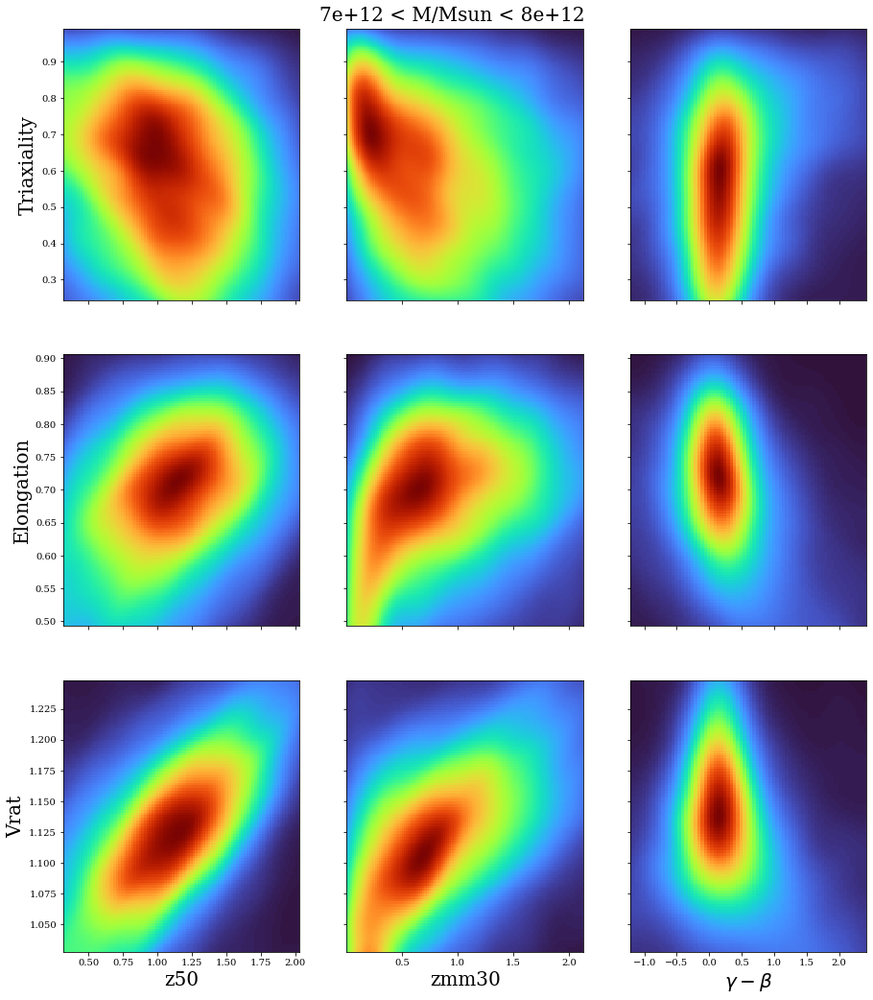

In [107]:
cprops = ['Triaxiality', 'Elongation', 'Vrat']
propages = ['z50', 'zmm30', r'$\gamma-\beta$']
#for k in range(1,3):
k = 0
fig, axs = plt.subplots(3,3, figsize=[15, 16], sharex='col', sharey='row')

for i in range(3):
    propage = propages[i]
    dat = ascii.read(path+sim+'/data/{}_{}_dat3d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) 
    idx = np.array(dat['Halo_index'])
    axs[-1,i].set_xlabel(propage, size=20)
    for j in range(3):
        prop = cprops[j]
        if prop == 'Triaxiality':
            b, c = halos['b(25)'][idx], halos['c(26)'][idx]
            y = (1-b**2)/(1-c**2)
        if prop == 'Elongation':
            b, c = halos['b(25)'][idx], halos['c(26)'][idx]
            y = 0.5*(b**2 + c**2)
        if prop == 'Vrat':
            rvir, vmax, mvir = halos['Rhalo(12)'][idx]/1e3, halos['Vmax(17)'][idx], halos['Mhalo(4)'][idx]
            y = vmax/np.sqrt(cp.G*mvir/rvir)
        if prop == 'com_offset/rvir':
            rvir, com = halos['Rhalo(12)'][idx], halos['com_offset(16)'][idx]
            y = com/rvir
        x = dat[propage]
        xmin, xmax = max(np.min(x), np.mean(x)-1.5*np.std(x)), min(np.max(x), np.mean(x)+2*np.std(x))
        ymin, ymax = max(np.min(y),np.mean(y)-1.5*np.std(y)), min(np.max(x), np.mean(x)+2*np.std(x))
        xi, yi, zi= kde_hist2d(x, y, nbins=200)
        axs[j,i].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
        axs[j,i].set_xlim(xmin, xmax)
        axs[j,i].set_ylim(ymin, ymax)
        # if j<2:
        #     axs[j,i].set_yscale('log')
        if i == 0:
            axs[j,i].set_ylabel(prop, size=20)
#plt.tight_layout()
fig.subplots_adjust(top=0.96)
fig.suptitle('{:2.1} < M/Msun < {:2.1}'.format(mb_min[k], mb_max[k]), size=20)
#plt.tight_layout()
fig.savefig('./figs/cprop_corr_{:1.2e}n.png'.format(mb_min[k]), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
fig.savefig('./figs/cprop_corr_{:1.2e}n.pdf'.format(mb_min[k]), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)



# 2D Props 

In [42]:
chirho = np.isfinite(dat[r'$\chi^2_\rho$'])

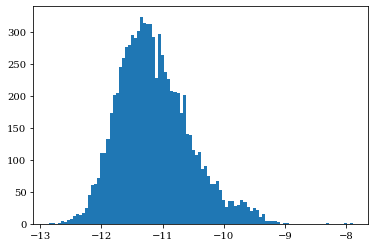

In [48]:
h = plt.hist(np.log10(dat[r'$\chi^2_\rho$'][chirho]), bins=100)

Text(0.5, 0.98, '3e+13 < M/Msun < 5e+13, 8424 halos')

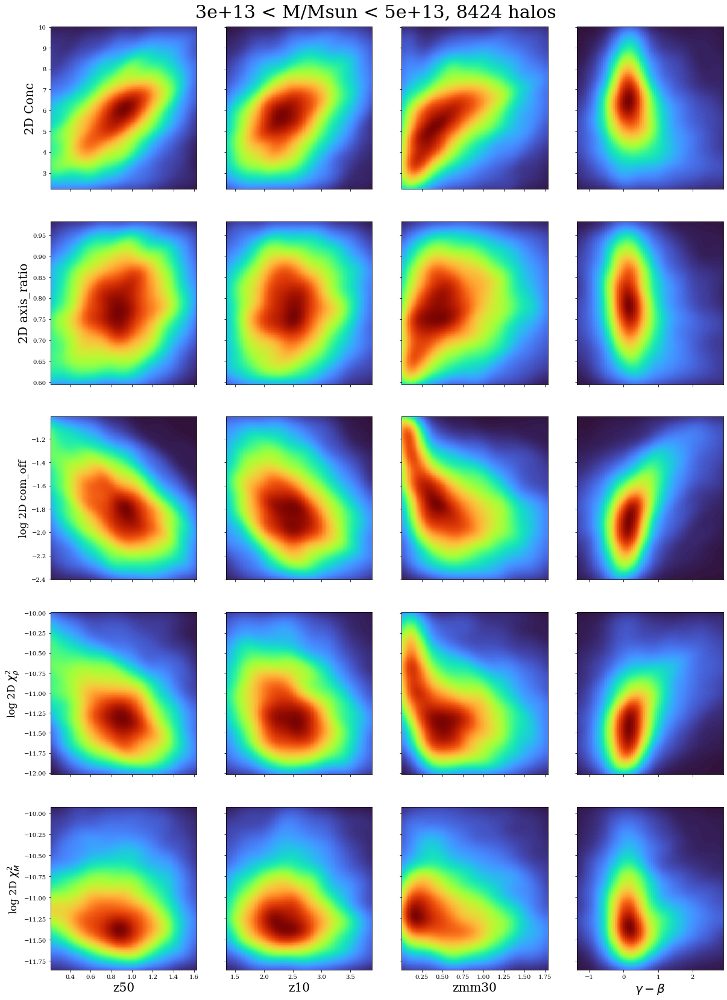

In [9]:
propages = ['z50', 'z10', 'zmm30', r'$\gamma-\beta$']
props2d = ['Conc', 'axis_ratio', 'com_off' , r'$\chi^2_\rho$', r'$\chi^2_M$']
#for k in range(1,3):
s = len(props2d)
a = len(propages)
k = 1
fig, axs = plt.subplots(s,a, figsize=[5*a, 5*s+1], sharex='col', sharey='row')

for i in range(a):
    propage = propages[i]
    dat = ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) 
    idx = np.array(dat['Halo_index'])
    axs[-1,i].set_xlabel(propage, size=20)
    for j in range(s):
        prop = props2d[j]
        yt = dat[prop]
        cnd = np.isfinite(yt)
        if j>1:
            y = np.log10(yt[cnd])
        else:
            y = yt[cnd]
        #y = np.sqrt(dat[prop])
        x = dat[propage][cnd]
        xmin, xmax = max(np.min(x), np.mean(x)-1.5*np.std(x)), np.mean(x)+2*np.std(x)
        ymin, ymax = max(np.min(y),np.mean(y)-1.5*np.std(y)), np.mean(y)+2*np.std(y)
        xi, yi, zi= kde_hist2d(x[(y>ymin)*(y<ymax)], y[(y>ymin)*(y<ymax)], nbins=200)
        axs[j,i].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
        axs[j,i].set_xlim(xmin, xmax)
        axs[j,i].set_ylim(ymin, ymax)
        #axs[j,i].set_yscale('log')
        # if j<2:
        #     axs[j,i].set_yscale('log')
        if i == 0:
            if j>1:
                axs[j,i].set_ylabel('log 2D '+prop, size=17)
            else:
                axs[j,i].set_ylabel('2D '+prop, size=20)
#plt.tight_layout()
fig.subplots_adjust(top=0.96)
fig.suptitle('{:2.1} < M/Msun < {:2.1}, {:d} halos'.format(mb_min[k], mb_max[k], len(x)), size=30)
#plt.tight_layout()
# fig.savefig('./figs/prop2d_corr_{:1.2e}n_{}.png'.format(mb_min[k], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
# fig.savefig('./figs/prop2d_corr_{:1.2e}n_{}.pdf'.format(mb_min[k], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)


# Only few 

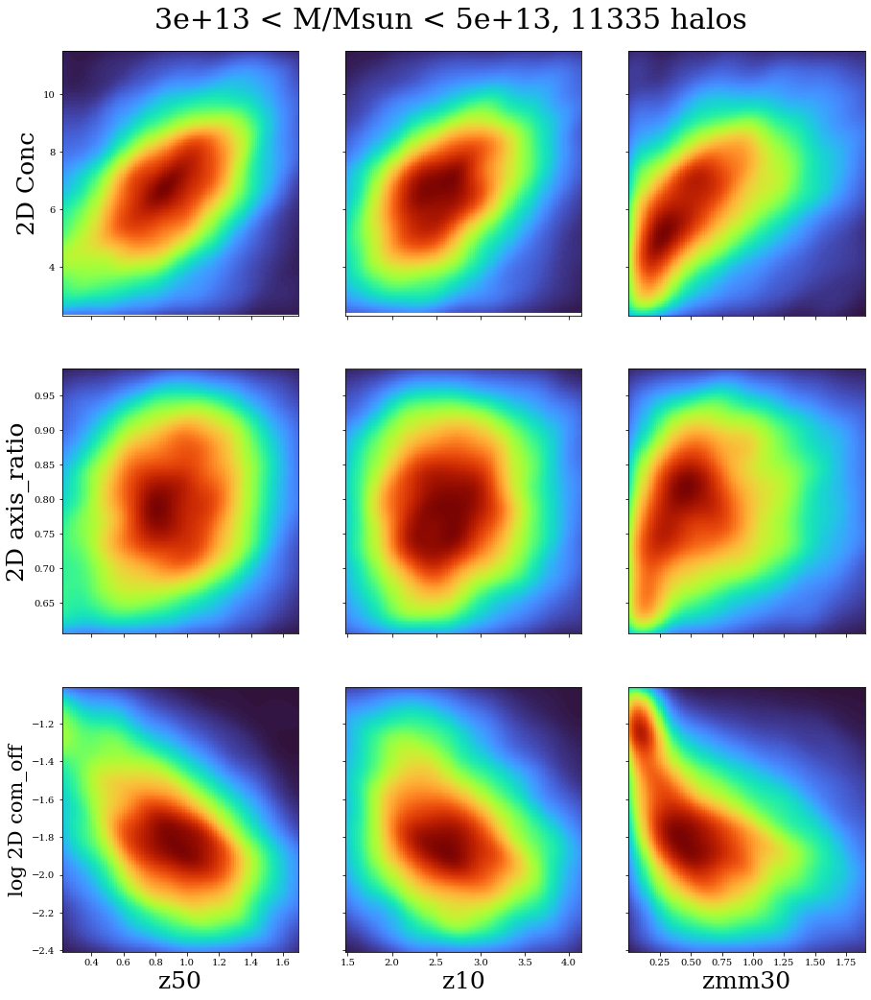

In [13]:
propages = ['z50', 'z10', 'zmm30']
props2d = ['Conc', 'axis_ratio', 'com_off']
#for k in range(1,3):
s = len(props2d)
a = len(propages)
k = 1
fig, axs = plt.subplots(s,a, figsize=[5*a, 5*s+1], sharex='col', sharey='row')

for i in range(a):
    propage = propages[i]
    dat = ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) 
    idx = np.array(dat['Halo_index'])
    axs[-1,i].set_xlabel(propage, size=25)
    for j in range(s):
        prop = props2d[j]
        yt = dat[prop]
        cnd = np.isfinite(yt)
        if j>1:
            y = np.log10(yt[cnd])
        else:
            y = yt[cnd]
        #y = np.sqrt(dat[prop])
        x = dat[propage][cnd]
        xmin, xmax = max(np.min(x), np.mean(x)-1.5*np.std(x)), np.mean(x)+2*np.std(x)
        ymin, ymax = max(np.min(y),np.mean(y)-1.5*np.std(y)), np.mean(y)+2*np.std(y)
        xi, yi, zi= kde_hist2d(x[(y>ymin)*(y<ymax)], y[(y>ymin)*(y<ymax)], nbins=200)
        axs[j,i].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
        axs[j,i].set_xlim(xmin, xmax)
        axs[j,i].set_ylim(ymin, ymax)
        #axs[j,i].set_yscale('log')
        # if j<2:
        #     axs[j,i].set_yscale('log')
        if i == 0:
            if j>1:
                axs[j,i].set_ylabel('log 2D '+prop, size=21)
            else:
                axs[j,i].set_ylabel('2D '+prop, size=25)
#plt.tight_layout()
fig.subplots_adjust(top=0.94)
fig.suptitle('{:2.1} < M/Msun < {:2.1}, {:d} halos'.format(mb_min[k], mb_max[k], len(x)), size=30)
#plt.tight_layout()
fig.savefig('./figs/prop2d_corr_{:1.2e}n_{}_r.png'.format(mb_min[k], sim), bbox_inches='tight', dpi=650, facecolor='white', transparent=False)
fig.savefig('./figs/prop2d_corr_{:1.2e}n_{}_r.pdf'.format(mb_min[k], sim), bbox_inches='tight', dpi=650, facecolor='white', transparent=False)


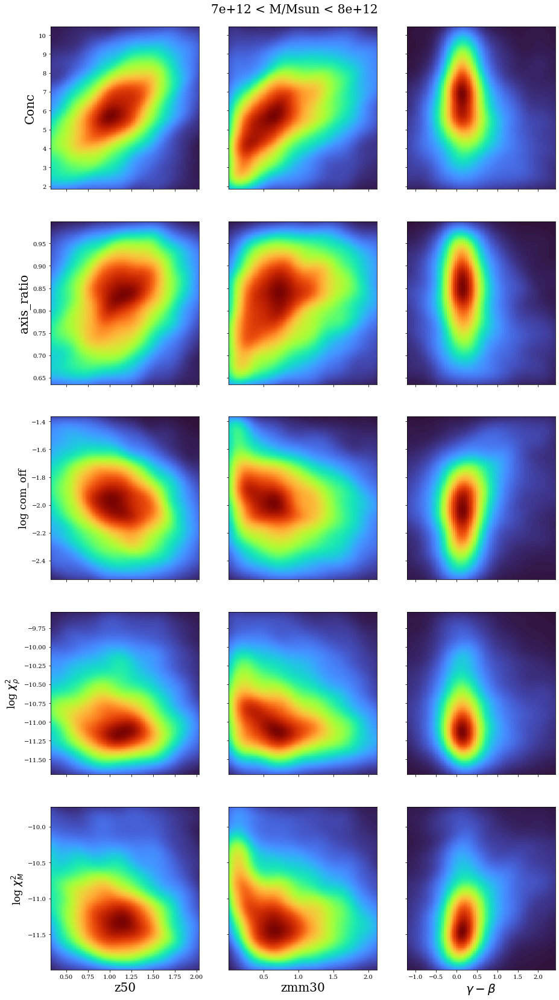

In [29]:
propages = ['z50',  'zmm30', r'$\gamma-\beta$']
props2d = ['Conc', 'axis_ratio', 'com_off' , r'$\chi^2_\rho$', r'$\chi^2_M$']
#for k in range(1,3):
s = len(props2d)
a = len(propages)
k = 0
fig, axs = plt.subplots(s,a, figsize=[5*a, 5*s+1], sharex='col', sharey='row')

for i in range(a):
    propage = propages[i]
    dat = ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) 
    idx = np.array(dat['Halo_index'])
    axs[-1,i].set_xlabel(propage, size=20)
    for j in range(s):
        prop = props2d[j]
        if j>1:
            y = np.log10(dat[prop][np.isfinite(dat[prop])])
        else:
            y = dat[prop][np.isfinite(dat[prop])]
        #y = np.sqrt(dat[prop])
        x = dat[propage][np.isfinite(dat[prop])]
        xmin, xmax = max(np.min(x), np.mean(x)-1.5*np.std(x)), min(np.max(x), np.mean(x)+2*np.std(x))
        ymin, ymax = max(np.min(y),np.mean(y)-1.5*np.std(y)), min(np.max(y), np.mean(y)+2*np.std(y))
        xi, yi, zi= kde_hist2d(x[(y>ymin)*(y<ymax)], y[(y>ymin)*(y<ymax)], nbins=200)
        axs[j,i].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
        axs[j,i].set_xlim(xmin, xmax)
        axs[j,i].set_ylim(ymin, ymax)
        #axs[j,i].set_yscale('log')
        # if j<2:
        #     axs[j,i].set_yscale('log')
        if i == 0:
            if j>1:
                axs[j,i].set_ylabel('log '+prop, size=17)
            else:
                axs[j,i].set_ylabel(prop, size=20)
#plt.tight_layout()
fig.subplots_adjust(top=0.96)
fig.suptitle('{:2.1} < M/Msun < {:2.1}'.format(mb_min[k], mb_max[k]), size=20)
#plt.tight_layout()
fig.savefig('./figs/prop2d_corr_{:1.2e}n.png'.format(mb_min[k]), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
fig.savefig('./figs/prop2d_corr_{:1.2e}n.pdf'.format(mb_min[k]), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)


# Trying $z_{50}$ vs different structural properties, with median lines

In [14]:
props = 'Conc', 'axis_ratio', 'com_off' , r'$\chi^2_\rho$'
propage = 'z50'
data2d = [ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) for k in range(4)]
dat = data2d[-1]

In [43]:
x = dat[props[1]]
y = dat[propage]
z = dat[props[2]]
zm = np.median(z)
print(zm)
mmins = 10**np.array([-4, -2.2, -1.9, -1.5])
mmaxs = 10**np.array([-2.2, -1.9, -1.5,  0])

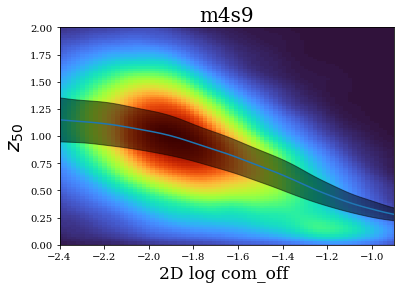

In [18]:
prop = 'com_off'
x = np.log10(dat[prop])
y = dat[propage]

mmins = 10**np.array([-4, -2.2, -1.9, -1.5])
mmaxs = 10**np.array([-2.2, -1.9, -1.5,  0])



nx, ny = x, y
#xi, yi, zi= kde_hist2d(nx[nx>2], ny[nx>2], nbins=200)
xi, yi, zi= kde_hist2d(nx, ny, nbins=200)

zi = zi.reshape(xi.shape)
plt.pcolormesh(xi, yi, zi, shading='auto', cmap=plt.cm.turbo)

yimean = np.sum(yi*zi, axis=1)/np.sum(zi, axis=1)
yimeans = np.sum(yi**2*zi, axis=1)/np.sum(zi, axis=1)
std = yimeans - yimean**2
plt.plot(xi[:,0], yimean)
plt.fill_between(xi[:,0], yimean-std, yimean+std, alpha=0.5, color='k')
#plt.xlim(0.6, 1)
plt.xlim(-2.4, -0.9)
plt.ylim(0,2)

plt.title(sim, size=20)
plt.xlabel('2D log {} '.format(prop), size=17)
plt.ylabel(r'$z_{50}$', size=20)

plt.savefig('./figs/{}_vs_conc_{:1.2e}_{}.png'.format(prop, mb_min[-1], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
plt.savefig('./figs/{}_vs_conc_{:1.2e}_{}.pdf'.format(prop, mb_min[-1], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)


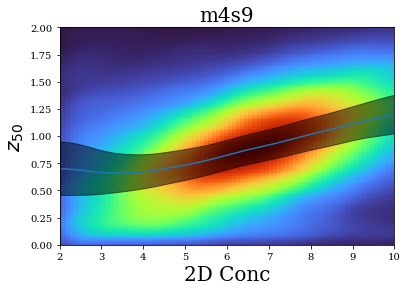

In [19]:
prop = 'Conc'
x = dat[prop]
y = dat[propage]

mmins = 10**np.array([-4, -2.2, -1.9, -1.5])
mmaxs = 10**np.array([-2.2, -1.9, -1.5,  0])

nx, ny = x, y
xi, yi, zi= kde_hist2d(nx[nx>2], ny[nx>2], nbins=200)
zi = zi.reshape(xi.shape)
plt.pcolormesh(xi, yi, zi, shading='auto', cmap=plt.cm.turbo)

yimean = np.sum(yi*zi, axis=1)/np.sum(zi, axis=1)
yimeans = np.sum(yi**2*zi, axis=1)/np.sum(zi, axis=1)
std = yimeans - yimean**2
plt.plot(xi[:,0], yimean)
plt.fill_between(xi[:,0], yimean-std, yimean+std, alpha=0.5, color='k')
plt.xlim(2,10)
plt.ylim(0,2)
plt.title(sim, size=20)
plt.xlabel('2D Conc', size=20)
plt.ylabel(r'$z_{50}$', size=20)

plt.savefig('./figs/z50_vs_conc_{:1.2e}_{}.png'.format(mb_min[-1], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
plt.savefig('./figs/z50_vs_conc_{:1.2e}_{}.pdf'.format(mb_min[-1], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)


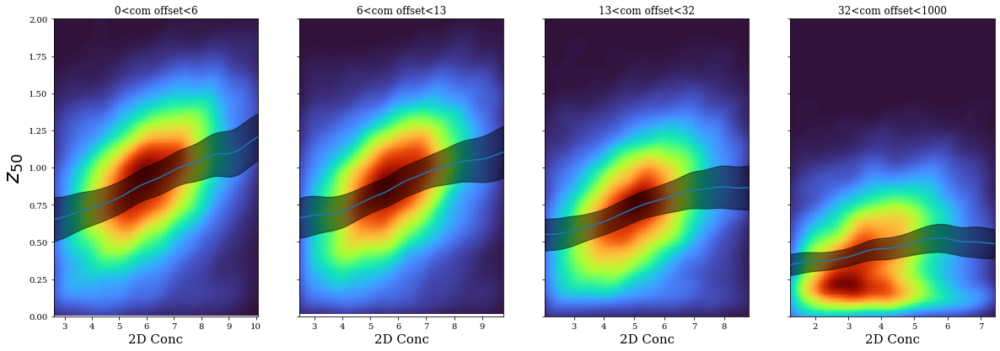

In [47]:
fig, axs = plt.subplots(1,4, figsize=[20,6.5], sharey=True)
for i in range(4):
    nx, ny = x[(z>mmins[i])*(z<mmaxs[i])], y[(z>mmins[i])*(z<mmaxs[i])]
    xmin, xmax = max(np.min(nx), np.mean(nx)-1.5*np.std(nx)), np.mean(nx)+2*np.std(nx)

    xi, yi, zi= kde_hist2d(nx[(nx>xmin)*(nx<xmax)], ny[(nx>xmin)*(nx<xmax)], nbins=200)
    zi = zi.reshape(xi.shape)
    axs[i].pcolormesh(xi, yi, zi, shading='auto', cmap=plt.cm.turbo)
    
    yimean = np.sum(yi*zi, axis=1)/np.sum(zi, axis=1)
    yimeans = np.sum(yi**2*zi, axis=1)/np.sum(zi, axis=1)
    std = yimeans - yimean**2
    axs[i].set_title('{:1.0f}<com offset<{:1.0f}'.format(mmins[i]*1e3, mmaxs[i]*1e3))
    axs[i].plot(xi[:,0], yimean)
    axs[i].set_xlabel('2D Conc', size=15)
    axs[i].fill_between(xi[:,0], yimean-std, yimean+std, alpha=0.5, color='k')
#axs[0].set_xlim(0,10)
axs[0].set_ylim(0,2)
axs[0].set_ylabel(r'$z_{50}$', size=25)

fig.savefig('./figs/z50_vs_conc_bycom_{:1.2e}n_{}.png'.format(mb_min[-1], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
fig.savefig('./figs/z50_vs_conc_bycom_{:1.2e}n_{}.pdf'.format(mb_min[-1], sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)


(0.0, 2.0)

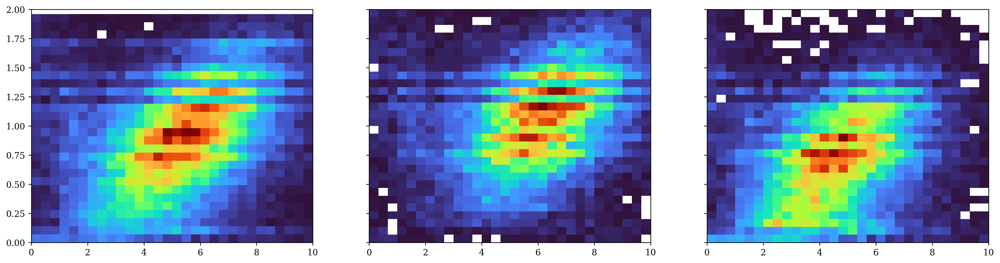

In [44]:
fig, axs = plt.subplots(1,3, figsize=[20,5], sharex=True, sharey=True)

h = axs[0].hist2d(x, y, cmap='turbo', range=[[0,10],[0,2.1]], cmin=1, bins=30)
h = axs[1].hist2d(x[z<zm], y[z<zm], cmap='turbo', range=[[0,10],[0,2]], cmin=1,  bins=30)
h = axs[2].hist2d(x[z>zm], y[z>zm], cmap='turbo', range=[[0,10],[0,2]], cmin=1,  bins=30)
#axs[0].set_xlim(0, 10)
axs[0].set_ylim(0, 2)

(0.0, 2.0)

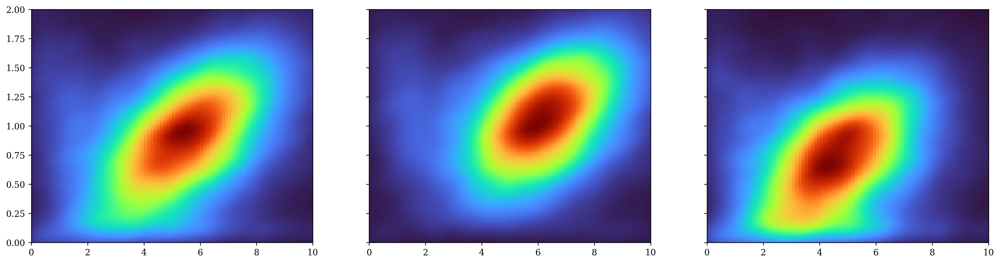

In [45]:
fig, axs = plt.subplots(1,3, figsize=[20,5], sharex=True, sharey=True)
xi, yi, zi= kde_hist2d(x, y, nbins=200)
xi2, yi2, zi2= kde_hist2d(x[z<zm], y[z<zm], nbins=200)
xi3, yi3, zi3= kde_hist2d(x[z>zm], y[z>zm], nbins=200)
axs[0].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
axs[1].pcolormesh(xi2, yi2, zi2.reshape(xi2.shape), shading='auto', cmap=plt.cm.turbo)
axs[2].pcolormesh(xi3, yi3, zi3.reshape(xi3.shape), shading='auto', cmap=plt.cm.turbo)

axs[0].set_xlim(0, 10)
axs[0].set_ylim(0, 2)

# prop 2D vs prop 2D

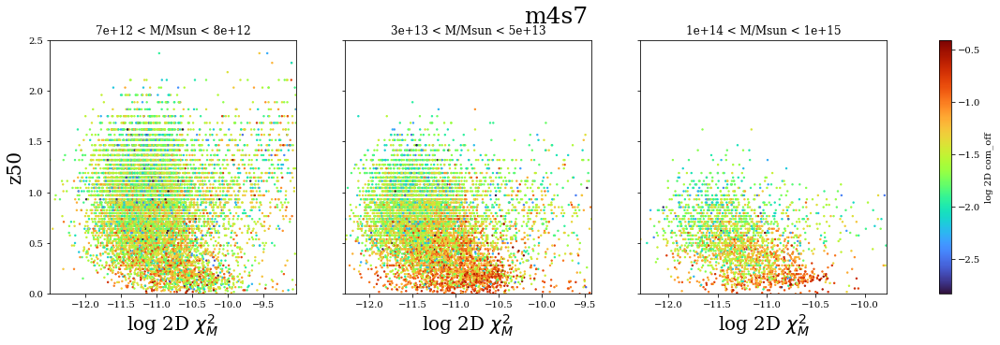

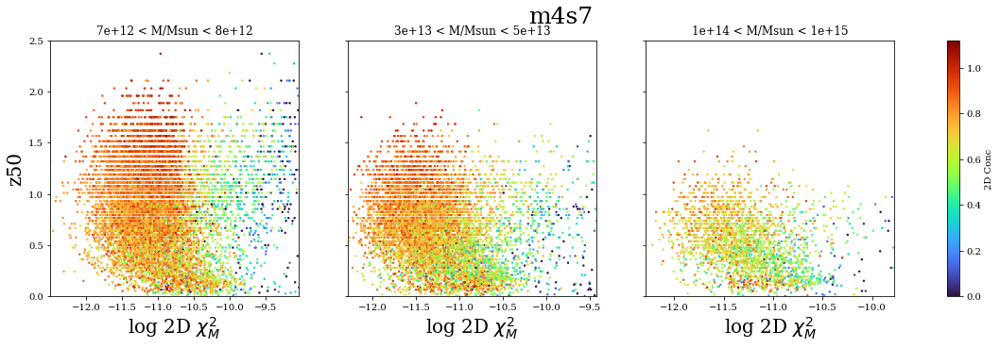

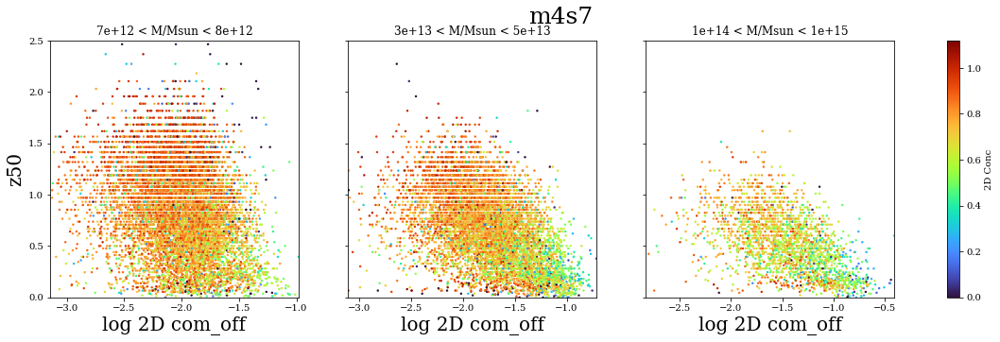

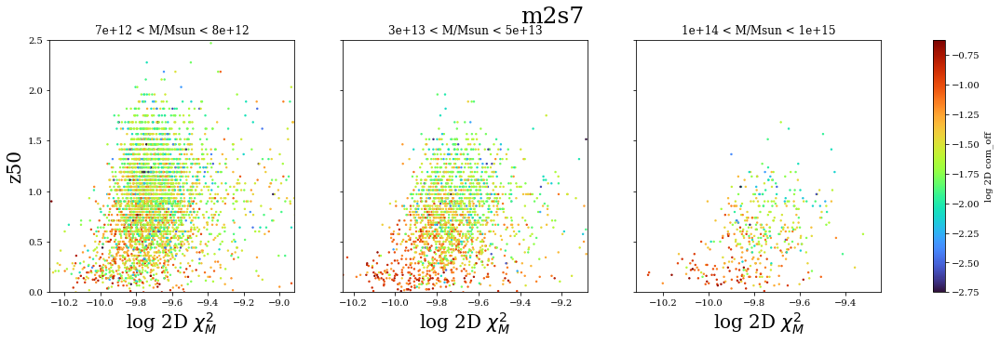

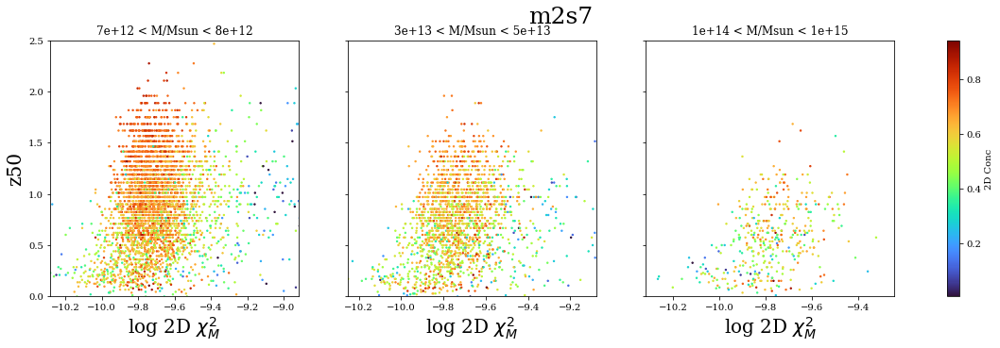

...

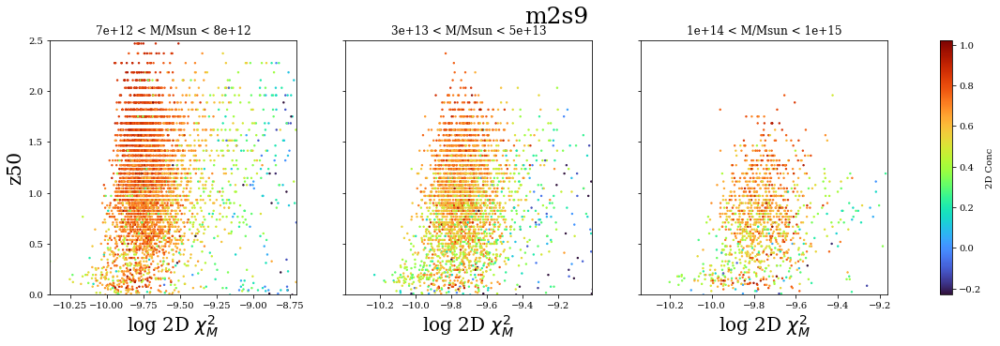

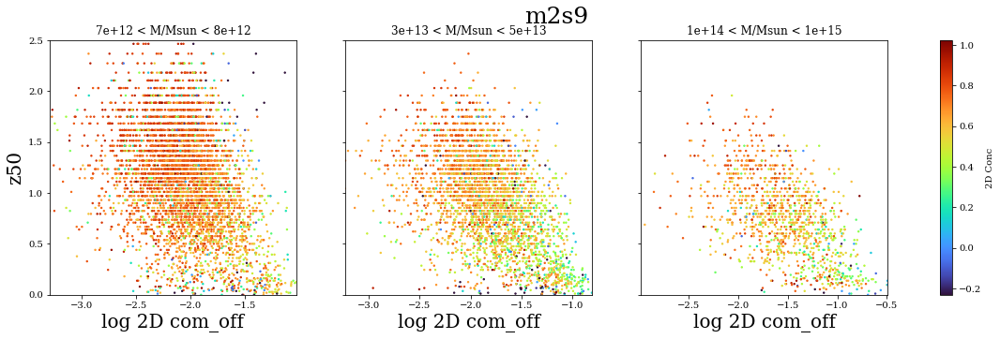

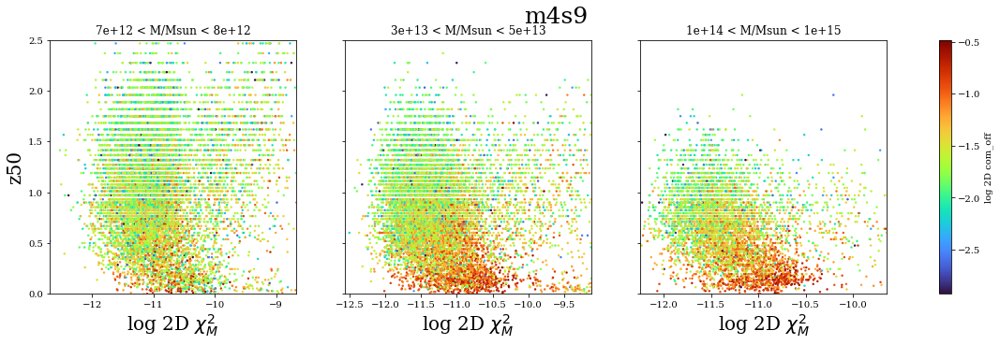

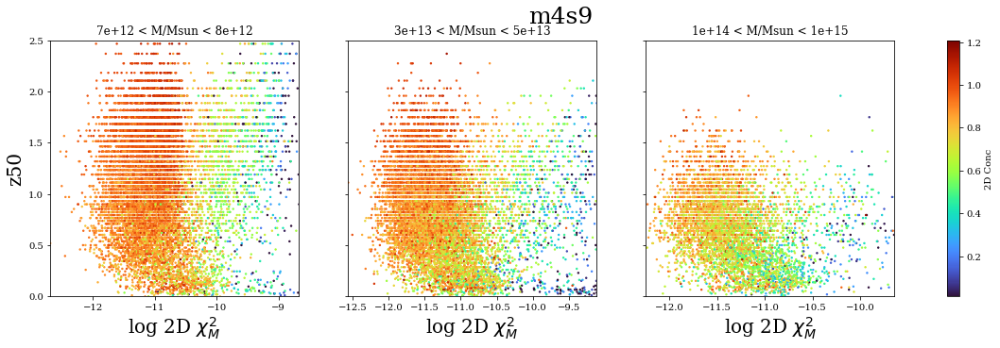

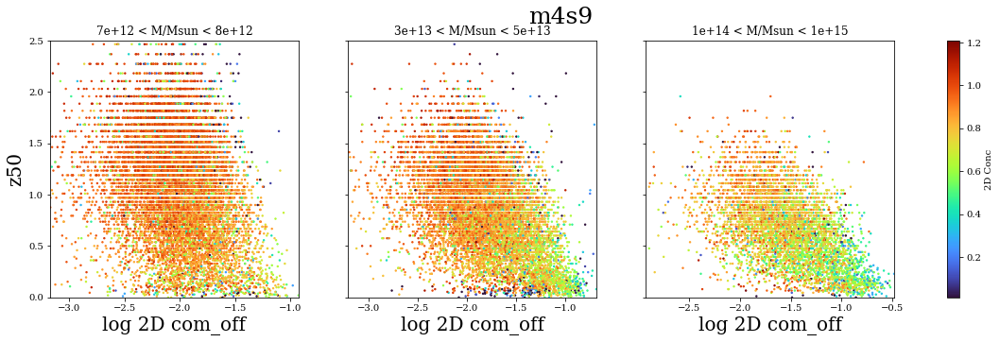

In [11]:
props2d = [ r'$\chi^2_M$', 'com_off', 'Conc']
s = len(props2d)
propages = ['z50']
simselecs = ['m4s7', 'm2s7', 'm2s9', 'm4s9']
for sim in simselecs: 
    for propage in propages:
        data2d = [ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) for k in range(3)]
        for i in range(s-1):
            prop1 = props2d[i]
            for k in range(i+1, s):
                prop2 = props2d[k]
                fig, axs = plt.subplots(1,3, figsize=[20,5], sharey=True)
                for j in range(3):
                    dat = data2d[j]
                    if i<2:
                        x = np.log10(dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                        y = np.log10(dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                    elif k>1:
                        y = dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                        x = np.log10(dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                    else:
                        x = dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]    
                        y = dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                    z = dat[propage][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                    xmin, xmax = max(np.min(x), np.mean(x)-3.5*np.std(x)), min(np.max(x), np.mean(x)+3.5*np.std(x))
                    ymin, ymax = max(np.min(y),np.mean(y)-3.5*np.std(y)), min(np.max(y), np.mean(y)+3.5*np.std(y))
                    axs[j].set_xlim(xmin, xmax)
                    axs[j].set_ylim(0, 2.5)
                    im = axs[j].scatter(x, z, c=y, s=2, vmin=ymin, vmax=ymax, cmap='turbo')
                    if i>-1:
                        axs[j].set_xlabel('log 2D '+prop1, size=20)
                    else:
                        axs[j].set_xlabel('2D '+prop1, size=20)
                    if j==0:
                        axs[j].set_ylabel(propage, size=20)

                    axs[j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))

                if k<2:
                    plt.colorbar(im, ax=axs.ravel().tolist(), label='log 2D '+prop2 )

                else:
                    plt.colorbar(im, ax=axs.ravel().tolist(), label='2D '+prop2)
                fig.suptitle(sim, size=25)
                fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n_{}.png'.format(propage, prop1, prop2, sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
                fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n_{}.pdf'.format(propage, prop1, prop2, sim), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)



In [ ]:
props2d = ['Conc', 'axis_ratio', 'com_off' , r'$\chi^2_\rho$', r'$\chi^2_M$']
s = len(props2d)
propages = ['z50']
for propage in propages:
    data2d = [ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) for k in range(3)]
    for i in range(s-1):
        prop1 = props2d[i]
        for k in range(i+1, s):
            prop2 = props2d[k]
            fig, axs = plt.subplots(1,3, figsize=[20,5], sharey=True)
            for j in range(3):
                dat = data2d[j]
                if i>1:
                    x = np.log10(dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                    y = np.log10(dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                elif k>1:
                    x = dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                    y = np.log10(dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                else:
                    x = dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]    
                    y = dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                z = dat[propage][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                xmin, xmax = max(np.min(x), np.mean(x)-3.5*np.std(x)), min(np.max(x), np.mean(x)+3.5*np.std(x))
                ymin, ymax = max(np.min(y),np.mean(y)-3.5*np.std(y)), min(np.max(y), np.mean(y)+3.5*np.std(y))
                axs[j].set_xlim(xmin, xmax)
                axs[j].set_ylim(0, 2.5)
                im = axs[j].scatter(x, z, c=y, s=2, vmin=ymin, vmax=ymax, cmap='turbo')
                if i>1:
                    axs[j].set_xlabel('log 2D '+prop1, size=20)
                else:
                    axs[j].set_xlabel('2D '+prop1, size=20)
                if j==0:
                    axs[j].set_ylabel(propage, size=20)
                
                axs[j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
      
            if k>1:
                plt.colorbar(im, ax=axs.ravel().tolist(), label='log 2D'+prop2 )

            else:
                plt.colorbar(im, ax=axs.ravel().tolist(), label='2D '+prop2)
            fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n.png'.format(propage, prop1, prop2), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
            fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n.pdf'.format(propage, prop1, prop2), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)



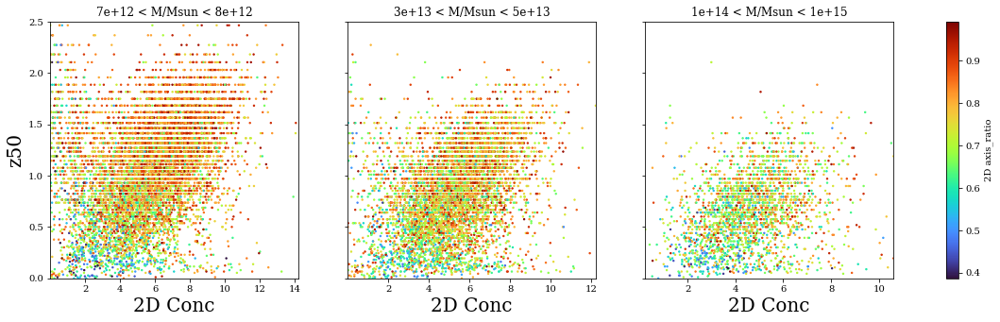

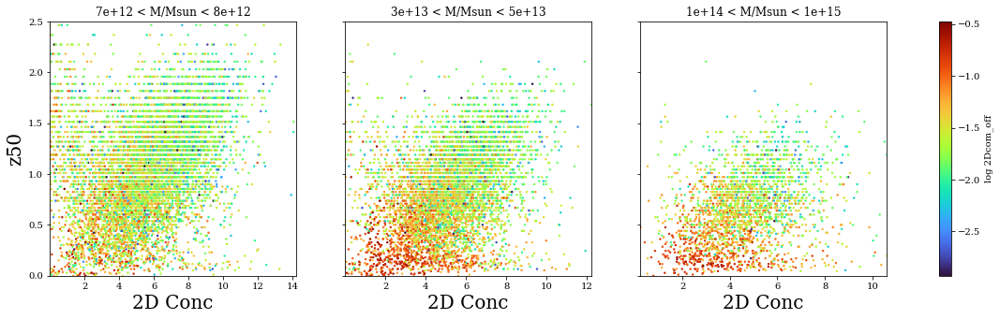

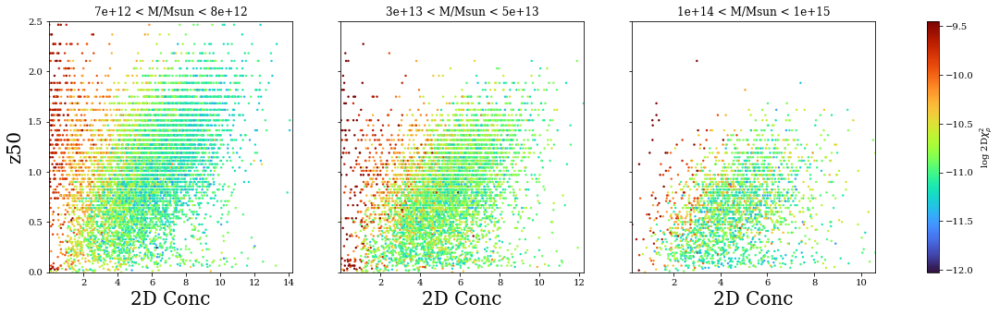

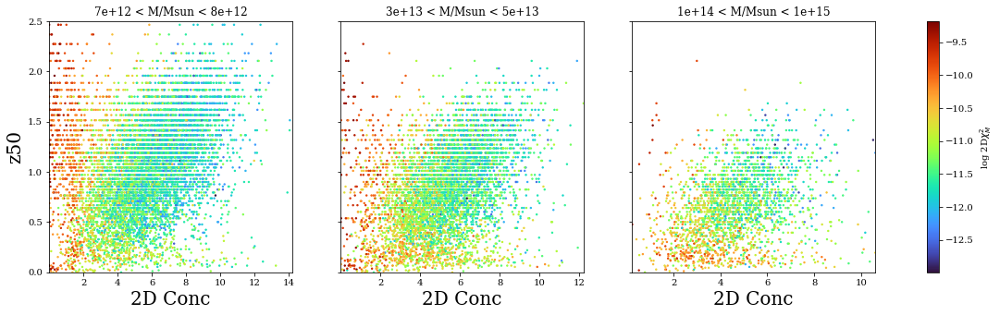

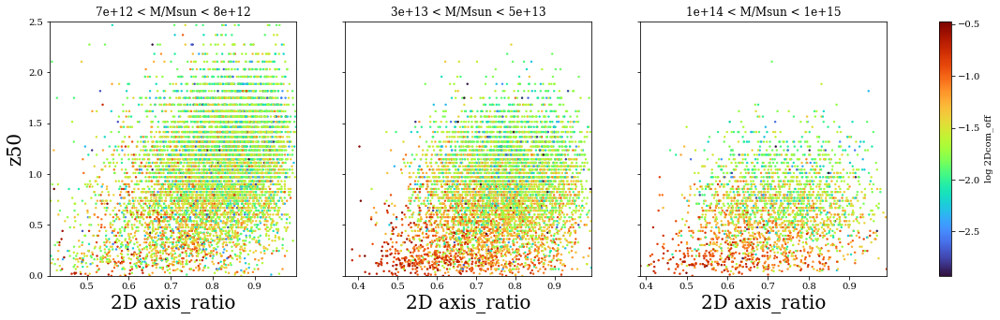

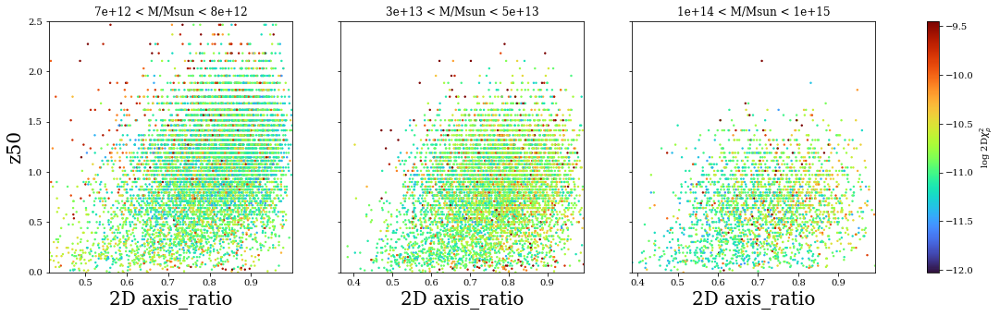

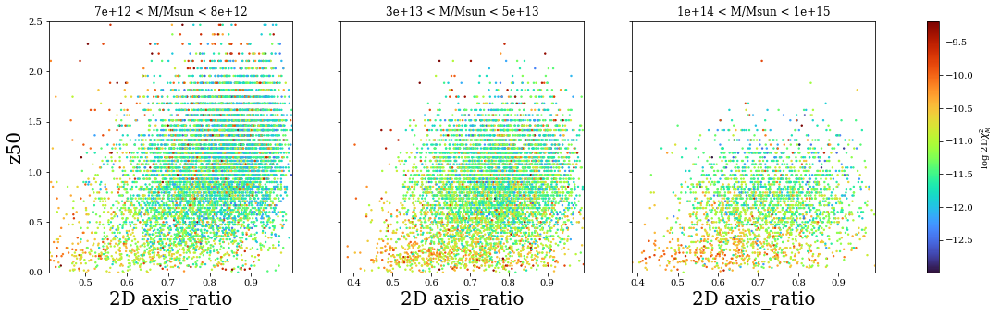

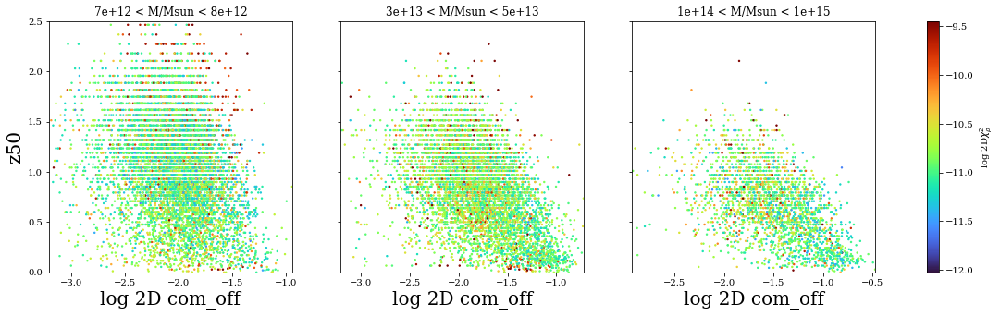

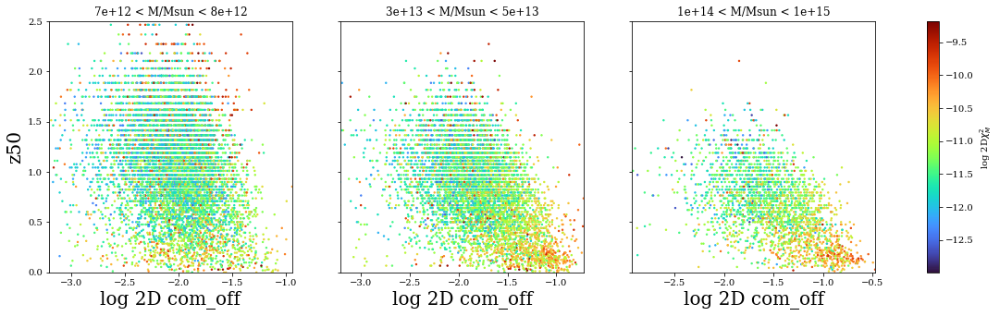

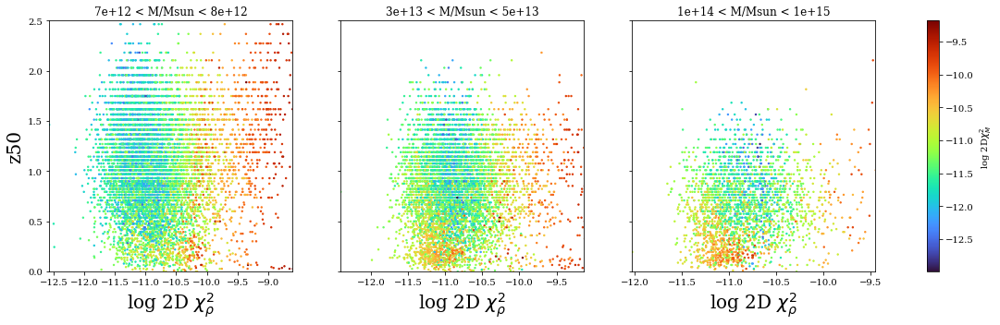

In [17]:
props2d = ['Conc', 'axis_ratio', 'com_off' , r'$\chi^2_\rho$', r'$\chi^2_M$']
s = len(props2d)
propages = ['z50']
for propage in propages:
    data2d = [ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) for k in range(3)]
    for i in range(s-1):
        prop1 = props2d[i]
        for k in range(i+1, s):
            prop2 = props2d[k]
            fig, axs = plt.subplots(1,3, figsize=[20,5], sharey=True)
            for j in range(3):
                dat = data2d[j]
                if i>1:
                    x = np.log10(dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                    y = np.log10(dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                elif k>1:
                    x = dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                    y = np.log10(dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
                else:
                    x = dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]    
                    y = dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                z = dat[propage][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
                xmin, xmax = max(np.min(x), np.mean(x)-3.5*np.std(x)), min(np.max(x), np.mean(x)+3.5*np.std(x))
                ymin, ymax = max(np.min(y),np.mean(y)-3.5*np.std(y)), min(np.max(y), np.mean(y)+3.5*np.std(y))
                axs[j].set_xlim(xmin, xmax)
                axs[j].set_ylim(0, 2.5)
                im = axs[j].scatter(x, z, c=y, s=2, vmin=ymin, vmax=ymax, cmap='turbo')
                if i>1:
                    axs[j].set_xlabel('log 2D '+prop1, size=20)
                else:
                    axs[j].set_xlabel('2D '+prop1, size=20)
                if j==0:
                    axs[j].set_ylabel(propage, size=20)
                
                axs[j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
      
            if k>1:
                plt.colorbar(im, ax=axs.ravel().tolist(), label='log 2D'+prop2 )

            else:
                plt.colorbar(im, ax=axs.ravel().tolist(), label='2D '+prop2)
            fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n.png'.format(propage, prop1, prop2), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
            fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n.pdf'.format(propage, prop1, prop2), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)



## Structural property vs Structural property colored by age

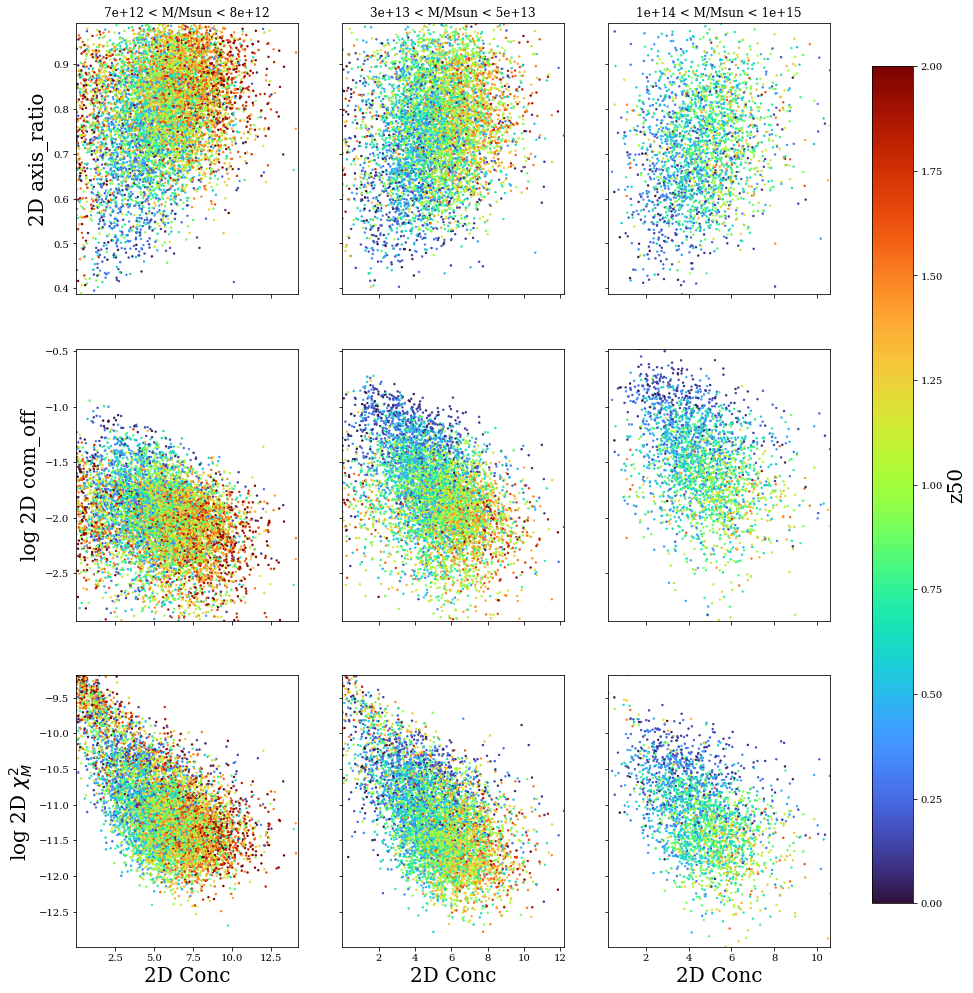

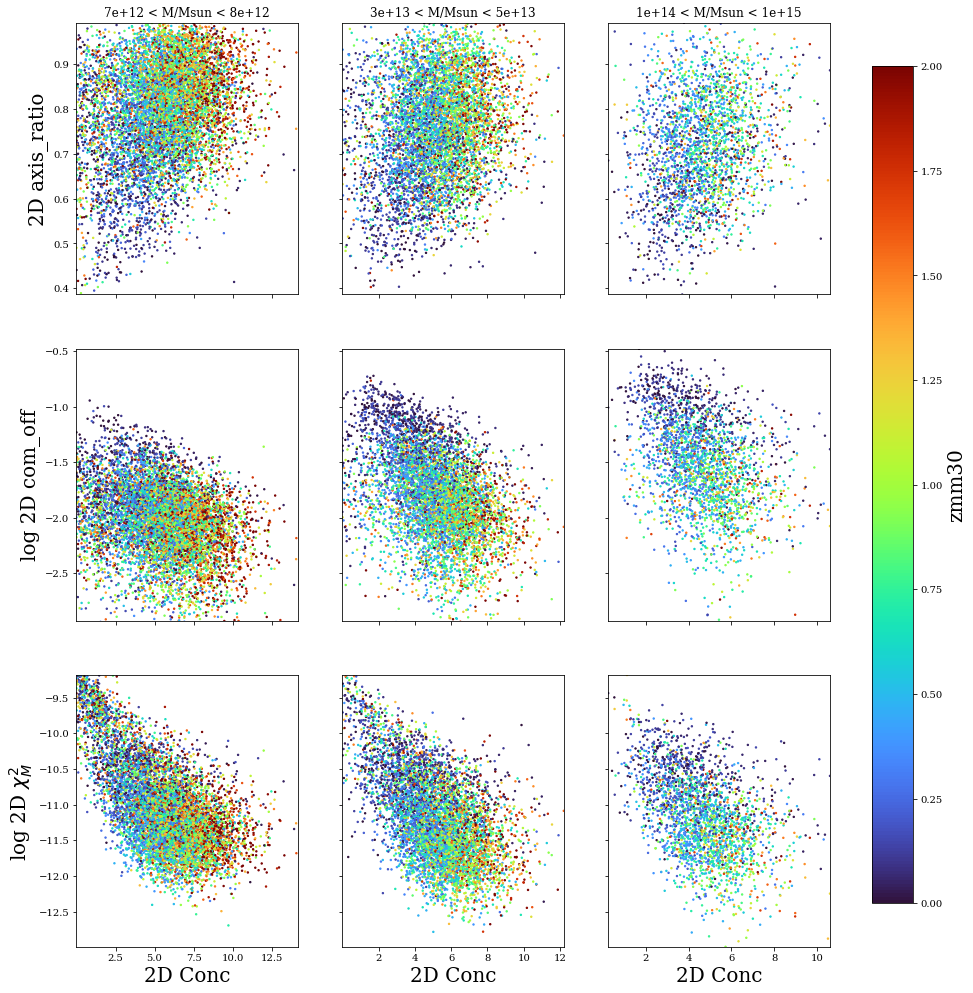

In [9]:
props2d = ['axis_ratio', 'com_off' , r'$\chi^2_M$']
s = len(props2d)
propages = ['z50', 'zmm30']
for propage in propages:
    data2d = [ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) for k in range(3)]
    
    prop1 = 'Conc'
    fig, axs = plt.subplots(3,3, figsize=[15,17], sharey='row', sharex='col')
    for k in range(s):
        prop2 = props2d[k]
        for j in range(3):
            dat = data2d[j]
            x = dat[prop1][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
            if k>0:
                y = np.log10(dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])])
            else:  
                y = dat[prop2][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
            z = dat[propage][np.isfinite(dat[prop1])*np.isfinite(dat[prop2])]
            xmin, xmax = max(np.min(x), np.mean(x)-3.5*np.std(x)), min(np.max(x), np.mean(x)+3.5*np.std(x))
            ymin, ymax = max(np.min(y),np.mean(y)-3.5*np.std(y)), min(np.max(y), np.mean(y)+3.5*np.std(y))
            axs[k,j].set_xlim(xmin, xmax)
            axs[k,j].set_ylim(ymin, ymax)
            im = axs[k,j].scatter(x, y, c=z, s=2, vmin=0, vmax=2, cmap='turbo')
            if k==2:
                axs[k,j].set_xlabel('2D '+prop1, size=20)
            if j==0:
                if k>0:
                    axs[k,j].set_ylabel('log 2D '+prop2, size=20)
                else:
                    axs[k,j].set_ylabel('2D '+prop2, size=20)
            if k == 0:
                axs[k,j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
        if k==1:
            cbar = plt.colorbar(im, ax=axs.ravel().tolist(), fraction=0.05)
            cbar.set_label(propage, fontsize=20)
    fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n.png'.format(prop1, 'all', propage), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)
    fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}n.pdf'.format(prop1, 'all', propage), bbox_inches='tight', dpi=350, facecolor='white', transparent=False)



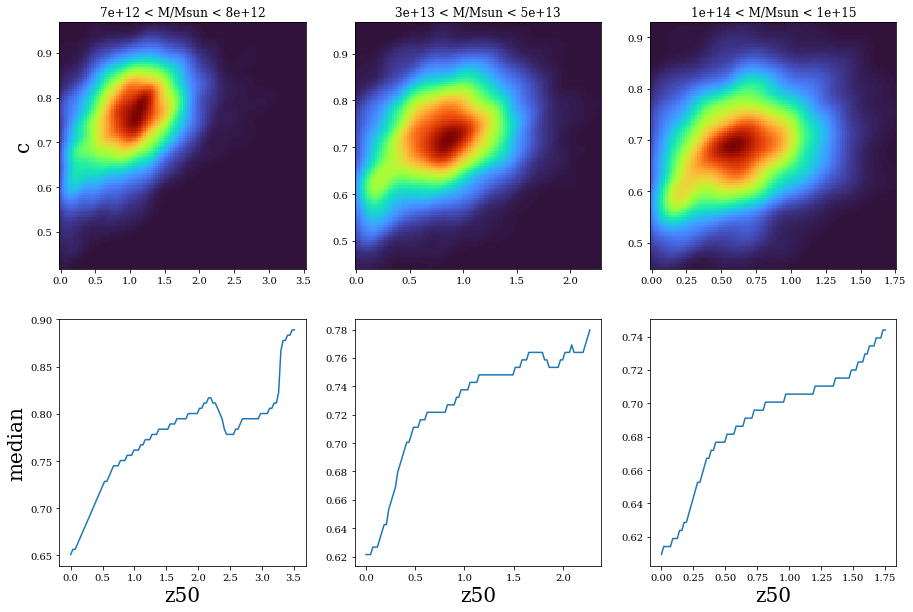

In [49]:
prop = 'c(26)'
fig, axs = plt.subplots(2,3, figsize=[15,10])
#fig2, axs2 = plt.subplots(2,3, figsize=[15,5])
bns = [40, 32, 20]
mranges = [2.5,2,1.5]
for j in range(3):
    dat = data3d[j]
    idx = np.array(dat['Halo_index'])
    
    #y = halos[prop][idx]
    #x = dat[propage]
    
    y = halos[prop][idx][halos[prop][idx]>0]
    x = dat[propage][halos[prop][idx]>0]
     
    #xi, yi, zi= kde_hist2d(x, np.log10(y), nbins=100)
    xi, yi, zi= kde_hist2d(x, y, nbins=100)
    axs[0,j].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
    aczi = np.cumsum(zi.reshape(xi.shape), axis=1)
    arrmed = np.zeros(aczi.shape[0], dtype=int)
    for i in range(len(arrmed)):
        arrmed[i] = np.min(np.where(aczi[i,:]/aczi[i,-1]>0.5))

    axs[1,j].set_xlabel(propage, size=20)
    axs[1,j].plot(xi[:,0], yi[0,arrmed])
    
    if j==0:
        #axs[0,j].set_ylabel('log '+ prop[:-4], size=20)
        axs[0,j].set_ylabel(prop[:-4], size=20)
        axs[1,j].set_ylabel('median', size=20)
    #axs2[j].set_xlabel(propage, size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[0,j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
fig.savefig('./figs/s{}_corr_{}n.png'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
fig.savefig('./figs/s{}_corr_{}n.pdf'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)

# fig2.savefig('./figs/s{}_corr_{}_med.png'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
# fig2.savefig('./figs/s{}_corr_{}_med.pdf'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)

## Combined properties : Triaxiality 

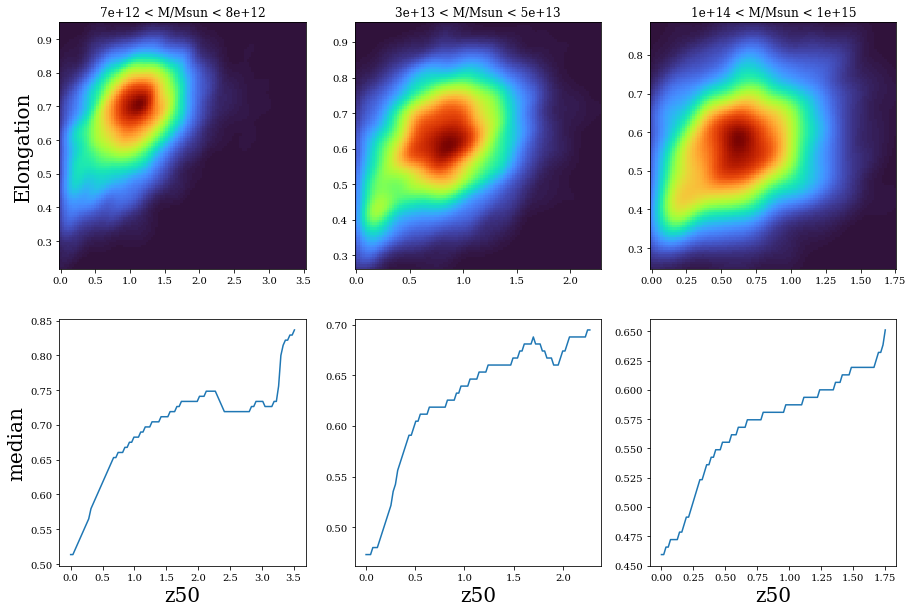

In [60]:
prop = 'Elongation'
fig, axs = plt.subplots(2,3, figsize=[15,10])
#fig2, axs2 = plt.subplots(2,3, figsize=[15,5])
bns = [40, 32, 20]
mranges = [2.5,2,1.5]
for j in range(3):
    dat = data3d[j]
    idx = np.array(dat['Halo_index'])
    
    #y = halos[prop][idx]
    #x = dat[propage]
    
    mvir = halos['Mhalo(4)'][idx]
    b = halos['b(25)'][idx]
    c = halos['c(26)'][idx]
    T = (1-b**2)/(1-c**2)
    E = (b**2+c**2)/2
    rvir = halos['Rhalo(12)'][idx]/1e3
    vvir = np.sqrt(cp.G*mvir/rvir)
    vmax = halos['Vmax(17)'][idx]
    x = dat[propage]
    #y = (1-b**2)/(1-c**2)
    y = E
    #xi, yi, zi= kde_hist2d(x, np.log10(y), nbins=100)
    xi, yi, zi= kde_hist2d(x, y, nbins=100)
    axs[0,j].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
    aczi = np.cumsum(zi.reshape(xi.shape), axis=1)
    arrmed = np.zeros(aczi.shape[0], dtype=int)
    for i in range(len(arrmed)):
        arrmed[i] = np.min(np.where(aczi[i,:]/aczi[i,-1]>0.5))

    axs[1,j].set_xlabel(propage, size=20)
    axs[1,j].plot(xi[:,0], yi[0,arrmed])
    
    if j==0:
        #axs[0,j].set_ylabel('log '+ prop, size=20)
        axs[0,j].set_ylabel(prop, size=20)
        axs[1,j].set_ylabel('median', size=20)
    #axs2[j].set_xlabel(propage, size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[0,j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
fig.savefig('./figs/s{}_corr_{}n.png'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
fig.savefig('./figs/s{}_corr_{}n.pdf'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)

# fig2.savefig('./figs/s{}_corr_{}_med.png'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
# fig2.savefig('./figs/s{}_corr_{}_med.pdf'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)

## Using 3D Props fitted 

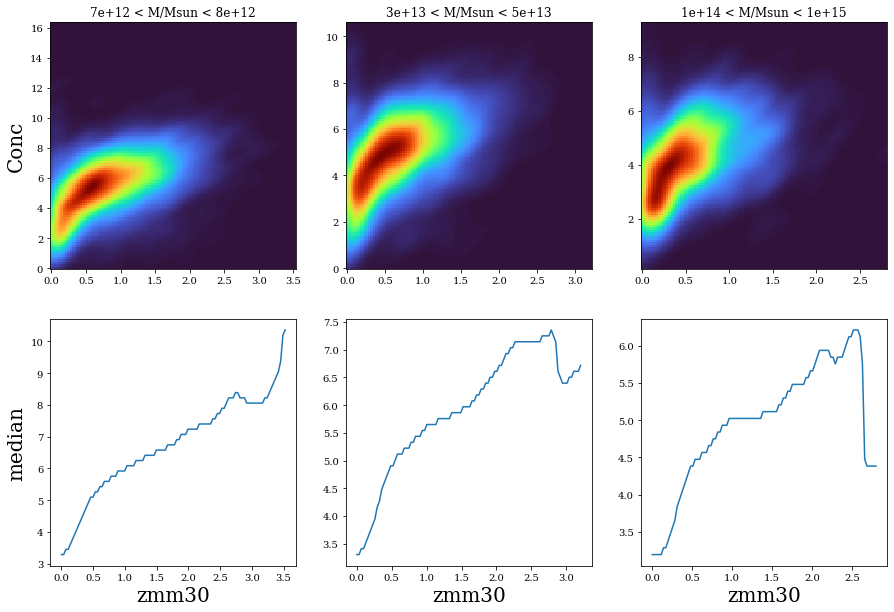

In [22]:
prop = 'Conc'
fig, axs = plt.subplots(2,3, figsize=[15,10])
#fig2, axs2 = plt.subplots(2,3, figsize=[15,5])
bns = [40, 32, 20]
mranges = [2.5,2,1.5]
for j in range(3):
    dat = data3d[j]
    idx = np.array(dat['Halo_index'])
    
    #y = halos[prop][idx]
    #x = dat[propage]
    
    #y = halos[prop][idx][halos[prop][idx]>0]
    #x = dat[propage][halos[prop][idx]>0]
    
    y = dat[prop][np.isfinite(dat[prop])]
    x = dat[propage][np.isfinite(dat[prop])]
    
    xi, yi, zi= kde_hist2d(x, y, nbins=100)
    axs[0,j].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
    aczi = np.cumsum(zi.reshape(xi.shape), axis=1)
    arrmed = np.zeros(aczi.shape[0], dtype=int)
    for i in range(len(arrmed)):
        arrmed[i] = np.min(np.where(aczi[i,:]/aczi[i,-1]>0.5))

    axs[1,j].set_xlabel(propage, size=20)
    axs[1,j].plot(xi[:,0], yi[0,arrmed])
    
    if j==0:
        #axs[0,j].set_ylabel('log '+ prop[:-3], size=20)
        axs[0,j].set_ylabel(prop, size=20)
        axs[1,j].set_ylabel('median', size=20)
    #axs2[j].set_xlabel(propage, size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[0,j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))

fig.savefig('./figs/s{}_corr_{}n.png'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
fig.savefig('./figs/s{}_corr_{}n.pdf'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)

# fig2.savefig('./figs/s{}_corr_{}_med.png'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
# fig2.savefig('./figs/s{}_corr_{}_med.pdf'.format(propage, prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)

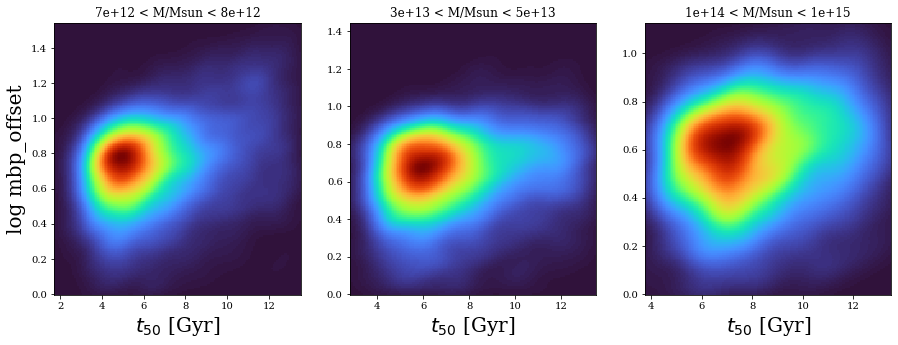

In [33]:
prop = 'mbp_offset(15)'
fig, axs = plt.subplots(1,3, figsize=[15,5])
bns = [40, 32, 20]
mranges = [2.5,2,1.5]
cosmol = LambdaCDM(H0=100 * 0.7, Om0=sim1.om0, Ode0=1 - sim1.om0)
for j in range(3):
    dat = data3d[j]
    idx = np.array(dat['Halo_index'])
    y = halos[prop][idx][halos[prop][idx]>1]
    #y = dat[prop][np.isfinite(dat[prop])]
    x = cosmol.age(dat['z50'][halos[prop][idx]>1]).value
    
    xi, yi, zi= kde_hist2d(x, np.log10(y), nbins=150)
    axs[j].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
    #h1, xedges, yedges, im = axs[j].hist2d(x, np.log10(y), cmin=1, bins=bns[j], cmap=plt.cm.turbo)
    axs[j].set_xlabel(r'$t_{50}$ [Gyr]', size=20)
    if j==0:
        axs[j].set_ylabel('log '+ prop[:-4], size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
plt.savefig('st50_corr_{}.png'.format(prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
plt.savefig('st50_corr_{}.pdf'.format(prop[:-4]), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)

# 2D PROPERTIES vs z50

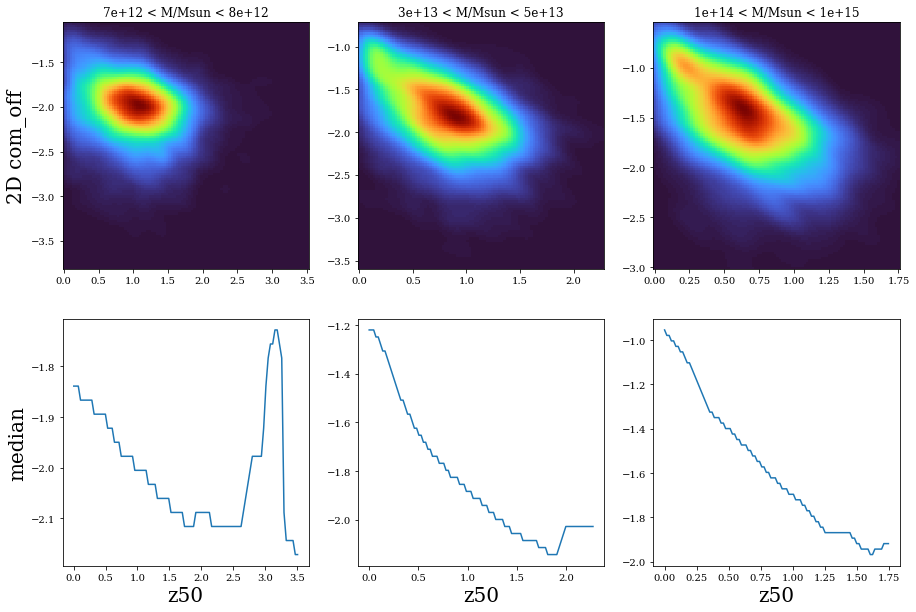

In [41]:
prop = 'com_off'
fig, axs = plt.subplots(2,3, figsize=[15,10])
bns = [50, 40, 20]
for j in range(3):
    dat = data2d[j]
    #y = dat[prop][dat[prop]<0.03]
    #x = dat['z50'][dat[prop]<0.03]
    y = dat[prop][np.isfinite(dat[prop])]
    x = dat[propage][np.isfinite(dat[prop])]
    
    xi, yi, zi= kde_hist2d(x, np.log10(y), nbins=100)
    axs[0,j].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
    aczi = np.cumsum(zi.reshape(xi.shape), axis=1)
    arrmed = np.zeros(aczi.shape[0], dtype=int)
    for i in range(len(arrmed)):
        arrmed[i] = np.min(np.where(aczi[i,:]/aczi[i,-1]>0.5))

    axs[1,j].set_xlabel(propage, size=20)
    axs[1,j].plot(xi[:,0], yi[0,arrmed])
    
    if j==0:
        #axs[0,j].set_ylabel('log '+ prop[:-3], size=20)
        axs[0,j].set_ylabel('2D '+prop, size=20)
        axs[1,j].set_ylabel('median', size=20)
    #axs2[j].set_xlabel(propage, size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[0,j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
fig.savefig('./figs/s_2d_{}_corr_{}n.png'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
fig.savefig('./figs/s_2d_{}_corr_{}n.pdf'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)


## prop 2D vs prop 2D

In [45]:
propage = 'zmm30'
data2d = [ascii.read(path+sim+'/data/{}_{}_dat2d_{:1.2e}.dat'.format(propage, sim, mb_min[k])) for k in range(3)]



### SCATTER PLOTS

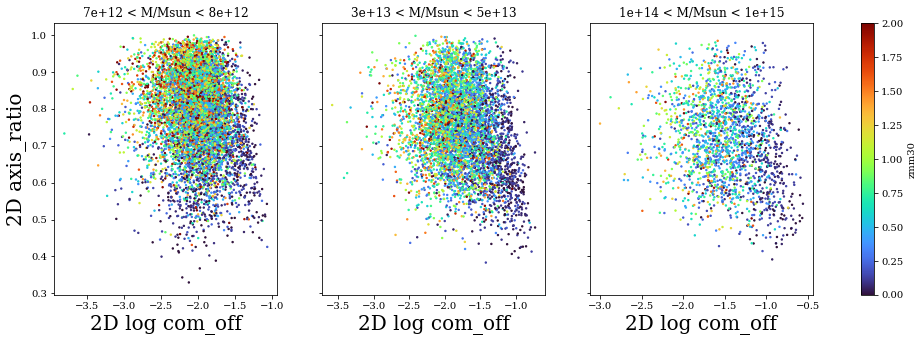

In [57]:
prop1 = 'com_off' 
prop2 = 'axis_ratio'
fig, axs = plt.subplots(1,3, figsize=[17,5], sharey=True)
for j in range(3):
    dat = data2d[j]
    x = dat[prop1][np.isfinite(dat[prop1])]
    y = dat[prop2][np.isfinite(dat[prop1])]
    z = dat[propage][np.isfinite(dat[prop1])]
    im = axs[j].scatter(np.log10(x), y, c=z, s=2, vmin=0, vmax=2, cmap='turbo')
    
    axs[j].set_xlabel('2D log '+prop1, size=20)
    
    if j==0:
        #axs[0,j].set_ylabel('log '+ prop[:-3], size=20)
        axs[j].set_ylabel('2D '+prop2, size=20)
        #axs[1,j].set_ylabel('median', size=20)
    #axs2[j].set_xlabel(propage, size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
    #plt.colorbar(im, ax=axs[j], label="z50")
plt.colorbar(im, ax=axs.ravel().tolist(), label=propage)
fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}.png'.format(prop1, prop2, propage), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
fig.savefig('./figs/scatter_2d_{}_corr_{}_level{}.pdf'.format(prop1, prop2, propage), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)


In [ ]:
prop1 = 'com_off' 
prop2 = 'axis_ratio'
fig, axs = plt.subplots(1,3, figsize=[15,5])
for j in range(3):
    dat = data2d[j]
    x = dat[prop1][np.isfinite(dat[prop1])]
    y = dat[prop2][np.isfinite(dat[prop1])]
    axs[j].scatter(np.log10(x), y, s=0.5)
    
    axs[j].set_xlabel('2D log '+prop1, size=20)
    
    if j==0:
        #axs[0,j].set_ylabel('log '+ prop[:-3], size=20)
        axs[j].set_ylabel('2D '+prop2, size=20)
        #axs[1,j].set_ylabel('median', size=20)
    #axs2[j].set_xlabel(propage, size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
fig.savefig('./figs/scatter_2d_{}_corr_{}n.png'.format(prop1, prop2), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
fig.savefig('./figs/scatter_2d_{}_corr_{}n.pdf'.format(prop1, prop2), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)


In [ ]:
fig, axs = plt.subplots(2,3, figsize=[15,10])
bns = [50, 40, 20]
for j in range(3):
    dat = data2d[j]
    #y = dat[prop][dat[prop]<0.03]
    #x = dat['z50'][dat[prop]<0.03]
    y = dat[prop][np.isfinite(dat[prop])]
    x = dat[propage][np.isfinite(dat[prop])]
    
    xi, yi, zi= kde_hist2d(x, np.log10(y), nbins=100)
    axs[0,j].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.turbo)
    aczi = np.cumsum(zi.reshape(xi.shape), axis=1)
    arrmed = np.zeros(aczi.shape[0], dtype=int)
    for i in range(len(arrmed)):
        arrmed[i] = np.min(np.where(aczi[i,:]/aczi[i,-1]>0.5))

    axs[1,j].set_xlabel(propage, size=20)
    axs[1,j].plot(xi[:,0], yi[0,arrmed])
    
    if j==0:
        #axs[0,j].set_ylabel('log '+ prop[:-3], size=20)
        axs[0,j].set_ylabel('2D '+prop, size=20)
        axs[1,j].set_ylabel('median', size=20)
    #axs2[j].set_xlabel(propage, size=20)
        #axs[j].set_ylabel('Axis ratio c/a', size=20)
    axs[0,j].set_title('{:2.1} < M/Msun < {:2.1}'.format(mb_min[j], mb_max[j]))
fig.savefig('./figs/s_2d_{}_corr_{}n.png'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
fig.savefig('./figs/s_2d_{}_corr_{}n.pdf'.format(propage, prop), bbox_inches='tight', dpi=150, facecolor='white', transparent=False)


# PCA With Everything

### Choosing properties and generating a database for PCA

In [181]:
data_clean = []
variables = ['Mass', 'z50', 'Cml', 'cAHF', 'mbp_offset', 'com_offset', 'chi_rho', 'chi_m', 'lambda', 'b', 'c']
ahfprops = ['Mhalo(4)', 'cNFW(43)', 'mbp_offset(15)', 'com_offset(16)', 'lambda(20)', 'b(25)', 'c(26)']
prop3d = ['z50', 'Conc', 'Chi rho', 'Chi M']
for i in range(len(cl_data)):
    hid = cl_data[i]['Halo index']
    halidx = idkeys[hid]
    if halos['cNFW(43)'][halidx]>1:
        hal = [cl_data[i]['z50']]
        for i in range(3):
            if i > 0 :
                hal.append(np.log10(props3d[halidx][i][0]))
            else:
                hal.append(props3d[halidx][i])
        for pp in ahfprops: 
            hal.append(halos[pp][halidx])
        data_clean.append(hal)
            

In [182]:
data_clean = np.array(data_clean)
data_clean.shape

(170002, 11)

### Normalizing values to do a correct PCA

In [183]:
means = np.mean(data_clean, axis=0)
stds = np.std(data_clean, axis=0)


In [184]:
norm_data = (data_clean - means)/stds

In [185]:
rowtitles = ['z50', 'Conc', 'chi_rho', 'chi_m', 'Mhalo', 'cAHF', 'mbp_offset', 'com_offset', 'lambda', 'b', 'c']

In [186]:
from sklearn.decomposition import PCA 
pca = PCA()
pca_fit = pca.fit_transform(norm_data)

In [187]:
axes = pca.components_
exp_var = pca.explained_variance_
var_rat = pca.explained_variance_ratio_

Text(0, 0.5, 'ratio of explained var')

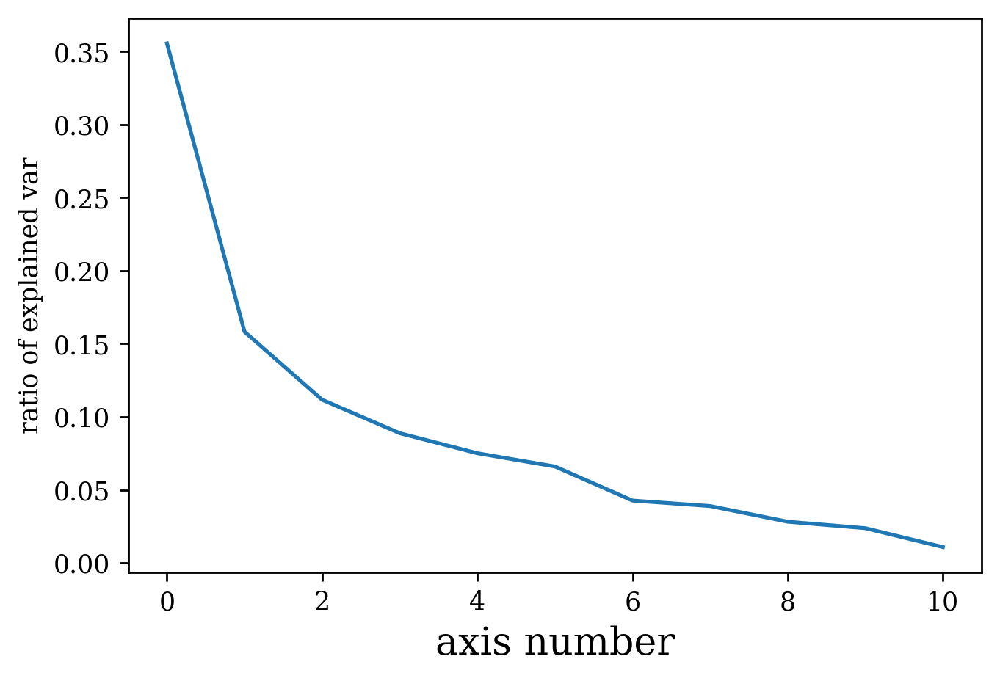

In [188]:
plt.plot(var_rat)
plt.xlabel("axis number", size=15)
plt.ylabel("ratio of explained var")
#plt.savefig('explained_variance_mah40.png', facecolor='white', transparent=True, dpi=300)

In [189]:
ax_table = Table(axes, names=rowtitles)

In [191]:
ax_table

z50,Conc,chi_rho,chi_m,Mhalo,cAHF,mbp_offset,com_offset,lambda,b,c
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
-0.36310364809241746,-0.40122814692023545,0.16552745457823245,0.275060681537588,0.20529199709356843,-0.403350556719233,0.07668864042846789,0.34355685765950605,0.2669284308973031,-0.3203216897674057,-0.31860365387907336
0.17673079127851876,0.09414041260118743,0.32368140151880737,0.5152428492995585,0.4695095047776341,0.05887762137877671,-0.4496369058205619,0.17251089872565598,-0.21969277755861227,0.20502615139551622,0.20861260936861303
0.11159647889626483,0.39804538389128974,-0.17685904057273386,-0.10777679926330017,0.16481003513745085,0.330046547125845,-0.22727356190443782,0.23816006827250832,-0.12570428216271123,-0.5054965235961845,-0.5200156503752313
-0.31442377674300537,0.02862365793333831,-0.7580707951976178,-0.10346937011518555,0.2323526647792243,-0.23485032967338826,-0.3069852570878389,0.1857019653898828,-0.02593036319422676,0.21045799007487517,0.17918866655902144
0.03928495792271137,-0.1222188080766746,-0.18060856325698887,0.12631457456401168,0.3409678878306538,-0.11493789378829884,0.5275834410012148,-0.19656532518310607,-0.6882702406890686,-0.09139376914876873,-0.08014768033867291
0.03369169376326394,0.23554197070084693,-0.030015564775496828,-0.0541912604493228,0.46610054112413996,0.2973541522857487,0.5518059421440036,0.2840671405709662,0.43953233781156237,0.17299096826663304,0.15993601043083167
-0.5130249340593748,0.21126044673408378,0.030248117503176443,0.19772693611934614,0.23954067754108366,0.1652509588794422,-0.08439814748572325,-0.708293308665067,0.20937720042006025,-0.045080611432876797,-0.11314770528123316
0.6621982342710575,-0.2286366395465122,-0.3422908375620875,0.20505794056380683,0.1675224999007572,-0.15032325336726957,-0.06719003687962793,-0.3395949416171237,0.3882091441084641,-0.15374444741800838,-0.07185555325031195
0.07864034007003491,-0.1280155616482547,0.31704062920983334,-0.7290163329892377,0.4809078351295458,-0.23052930564707572,-0.19129617507879376,-0.15500792589731294,-0.013530983662835665,-0.0008293180512469467,-0.015052339536487491


In [190]:
ax_table.write('./data/pc.csv', overwrite=True)

In [209]:
import re
def plot_pca_bars(data, wts, ncomp, show_fig=True, save_fig=True, 
            print_hr_table=True):
    """ Make bar chart of PCA data, and put into TeX table """
    # Plotting PCA weights on bar chart, where
    # pca = PCA(n_components=ncom)
    # wts = pca.components_.T
    gap = 2.
    barWidth = 1./(ncomp+gap)
    # Set position of bar on X axis
    brs = [np.arange(len(wts))]
    for i in range(ncomp-1):
        brs += [[ii + barWidth for ii in brs[-1]]]
    
    colours = ['#57106e','#bc3754','#fca50a','#fcffa4', 'k']
    
    plt.figure(figsize=(6, 4.5))
    for i in range(ncomp):
        plt.bar(brs[i], wts[:,i], width = barWidth, label='PC%1d'%(i+1), 
                edgecolor='k', color=colours[i])
    plt.legend(fancybox=0, framealpha=1., edgecolor='w', loc=3)
    plt.xticks([r+0.5-(1.+gap)/(2.*(ncomp+gap)) for r in range(len(wts))], 
            data, rotation=-75)#tex_labels, rotation=-75)#
    plt.xlim(-0.75, len(wts)+0.25)
    plt.ylim(-0.8, 0.8)
    plt.xlabel('DS indicator')
    plt.ylabel('Coordinate value')
    for i in np.arange(1, len(wts)):
        plt.plot([i-(1.+gap)/(2.*(ncomp+gap)), i-(1.+gap)/(2.*(ncomp+gap))], 
                [-1., 1.], c='k', linewidth=1.)
    plt.plot([-0.75, len(wts)+0.25], [0.3, 0.3], c='k', linewidth=1.)
    plt.plot([-0.75, len(wts)+0.25], [-0.3, -0.3], c='k', linewidth=1.)
    plt.tight_layout()
    if save_fig == True:
        plt.savefig('./figs/pca_bars.pdf')
        plt.savefig('./figs/pca_bars.png', bbox_inches='tight', dpi=150, facecolor='white', transparent=False)
    if show_fig == True:
        plt.show()
    
    
    if print_hr_table==True:
        # Putting PCA weights in a human-readable table
        for i in range(len(data)):
            str_1 = data[i]
            replace = [m.start() for m in re.finditer('_', str_1)]
            str_1 = list(str_1)
            for n in replace:
                str_1[n] = '\\_'
            str_1 = ''.join(str_1)
            #str_1 = tex_labels[i]
            for j in wts[i]:
                if np.abs(j) > 0.3:
                    str_1 += (' & \\bf{%6.2f}' % j)
                else:
                    str_1 += (' & %6.2f' % j)
            str_1 += '\\\\'
            print(str_1)
    
    return None

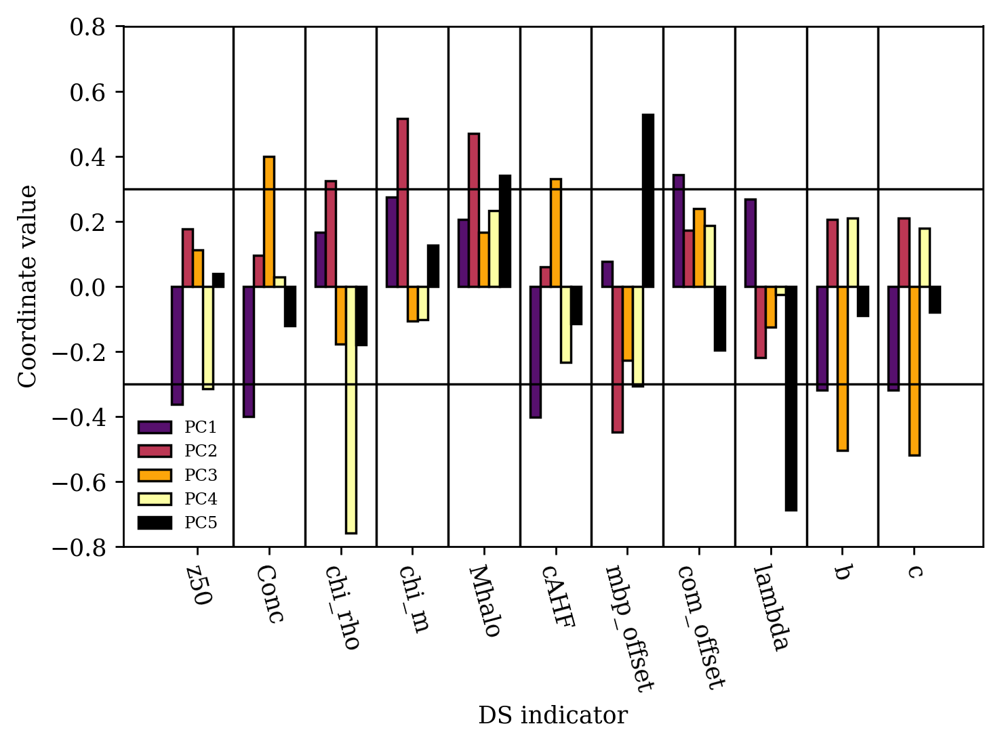

z50 & \bf{ -0.36} &   0.18 &   0.11 & \bf{ -0.31} &   0.04 &   0.03 & \bf{ -0.51} & \bf{  0.66} &   0.08 &   0.07 &  -0.10\\
Conc & \bf{ -0.40} &   0.09 & \bf{  0.40} &   0.03 &  -0.12 &   0.24 &   0.21 &  -0.23 &  -0.13 &  -0.02 & \bf{ -0.70}\\
chi\_rho &   0.17 & \bf{  0.32} &  -0.18 & \bf{ -0.76} &  -0.18 &  -0.03 &   0.03 & \bf{ -0.34} & \bf{  0.32} &  -0.00 &  -0.10\\
chi\_m &   0.28 & \bf{  0.52} &  -0.11 &  -0.10 &   0.13 &  -0.05 &   0.20 &   0.21 & \bf{ -0.73} &   0.02 &  -0.07\\
Mhalo &   0.21 & \bf{  0.47} &   0.16 &   0.23 & \bf{  0.34} & \bf{  0.47} &   0.24 &   0.17 & \bf{  0.48} &  -0.01 &   0.08\\
cAHF & \bf{ -0.40} &   0.06 & \bf{  0.33} &  -0.23 &  -0.11 &   0.30 &   0.17 &  -0.15 &  -0.23 &  -0.03 & \bf{  0.68}\\
mbp\_offset &   0.08 & \bf{ -0.45} &  -0.23 & \bf{ -0.31} & \bf{  0.53} & \bf{  0.55} &  -0.08 &  -0.07 &  -0.19 &   0.01 &  -0.12\\
com\_offset & \bf{  0.34} &   0.17 &   0.24 &   0.19 &  -0.20 &   0.28 & \bf{ -0.71} & \bf{ -0.34} &  -0.16 &   0.01 &   0.02

In [210]:
plot_pca_bars(rowtitles, axes.transpose(), 5, show_fig=True, save_fig=True, 
            print_hr_table=True)